# Cell State Dissection

Using ideas from the FineClustering analysis to dissect the major cell states in the data.

In [1]:
library(SnapATAC)
library(reshape2)
library(viridis)
library(scales)
library(ggplot2)
library(ggrepel)
library(DESeq2)
library(ClusterR)
library(RColorBrewer)
library(patchwork)
library(cowplot)
library(edgeR)
library(rtracklayer)

Loading required package: Matrix

Loading required package: rhdf5

Loading required package: viridisLite


Attaching package: ‘scales’


The following object is masked from ‘package:viridis’:

    viridis_pal


Loading required package: S4Vectors

Loading required package: stats4

Loading required package: BiocGenerics

Loading required package: parallel


Attaching package: ‘BiocGenerics’


The following objects are masked from ‘package:parallel’:

    clusterApply, clusterApplyLB, clusterCall, clusterEvalQ,
    clusterExport, clusterMap, parApply, parCapply, parLapply,
    parLapplyLB, parRapply, parSapply, parSapplyLB


The following objects are masked from ‘package:SnapATAC’:

    colMeans, colSums, rowMeans, rowSums


The following objects are masked from ‘package:Matrix’:

    colMeans, colSums, rowMeans, rowSums, which


The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


The following objects are masked from ‘package:base’:

    anyDuplicated,

In [2]:
qual_col_pals = brewer.pal.info[brewer.pal.info$category == 'qual',]
col_vector = unlist(mapply(brewer.pal, qual_col_pals$maxcolors, rownames(qual_col_pals)))

In [321]:
DAYS = c("D0", "D2", "D4", "D6", "D8", "D10", "D12", "D14")

In [6]:
pmat = readMM("../20200206_pmat_snapATAC/sessions/20200520_n68916/pmat.overlap.smallpeaks.sparse.mm")
pmat = as(pmat, "dgCMatrix")
dim(pmat)

[1]  68916 803958

In [7]:
# Metadata file from previous run
# should contain, sample_barcode as rowname, sample, umap1, umap2, cluster
metaData = read.table("../20200206_pmat_snapATAC/sessions/20200520_n68916/metadata.tsv", header = T)
rownames(metaData) = paste(metaData$sample, metaData$barcode, sep='_')
metaData$cells = rownames(metaData) # for cicero
dim(metaData)
head(metaData, 5)

[1] 68916     5

,barcode,sample,umap1,umap2,cells
,<fct>,<fct>,<dbl>,<dbl>,<chr>
D0_AAACAACGACGATTAC,AAACAACGACGATTAC,D0,6.565758,-8.649868,D0_AAACAACGACGATTAC
D0_AAACAACGAGCGCACT,AAACAACGAGCGCACT,D0,5.604522,-7.835411,D0_AAACAACGAGCGCACT
D0_AAACACGCTACGCCAC,AAACACGCTACGCCAC,D0,5.130516,-7.593246,D0_AAACACGCTACGCCAC
D0_AAACACGCTAGTACGG,AAACACGCTAGTACGG,D0,4.926843,-8.365463,D0_AAACACGCTAGTACGG
D0_AAACACGCTCCTCAAA,AAACACGCTCCTCAAA,D0,6.056337,-5.647577,D0_AAACACGCTCCTCAAA


In [8]:
regions = read.table("../20200206_pmat_snapATAC/sessions/20200520_n68916/peaks.overlap.smallpeaks.bed")
names(regions) = c("chr", "bp1", "bp2")
regions$site_name <- paste(regions$chr, regions$bp1, regions$bp2, sep="_")
row.names(regions) <- regions$site_name
dim(regions)
head(regions)

[1] 803958      4

,chr,bp1,bp2,site_name
,<fct>,<int>,<int>,<chr>
chr1_97145604_97145864,chr1,97145604,97145864,chr1_97145604_97145864
chr1_7538148_7538363,chr1,7538148,7538363,chr1_7538148_7538363
chr1_93196678_93196894,chr1,93196678,93196894,chr1_93196678_93196894
chr1_187577713_187577913,chr1,187577713,187577913,chr1_187577713_187577913
chr1_53278065_53278265,chr1,53278065,53278265,chr1_53278065_53278265
chr1_177176832_177177032,chr1,177176832,177177032,chr1_177176832_177177032


In [194]:
pmat_regions_gr = GRanges(sub("_", "-", sub("_", ":", rownames(regions))))

In [249]:
# check if reads at OCT promoter (none in initial version)
sum(pmat[,subjectHits(findOverlaps(GRanges(c("chr6:31170549-31170836")), pmat_regions_gr))])

[1] 537

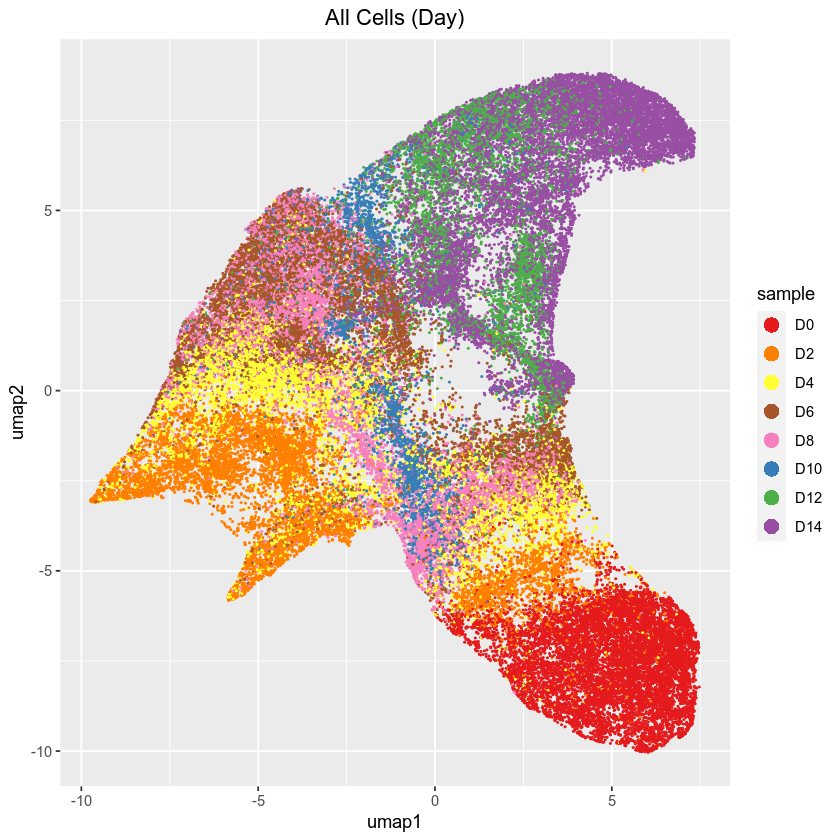

In [11]:
options(repr.plot.width = 7, repr.plot.height = 7)

df = data.frame(umap1=metaData$umap1, 
                umap2=metaData$umap2, 
                sample=metaData$sample)
# shuffle so days don't overlap
df = df[sample(dim(df)[1]), ]

ggplot(df) +
# ggplot(df[df$x.sp.sample %in% c("D14"), ]) +
geom_point(size=0.2, alpha=1, aes(x=umap1 , y=umap2, col=sample)) +
scale_color_brewer(breaks=DAYS, palette = "Set1") +
ggtitle("All Cells (Day)") + 
theme(plot.title = element_text(hjust = 0.5)) + 
guides(colour = guide_legend(override.aes = list(shape=16, alpha=1, size=4))) 

## Finer Clustering

In [12]:
library(RANN)
library(leiden)

In [15]:
feats = read.table("../20200206_pmat_snapATAC/sessions/20200520_n68916/features.9d.tsv", header = T)
rownames(feats) = feats$sample_barcode
feats$sample_barcode = NULL
head(feats,3)

,X1,X2,X3,X4,X5,X6,X7,X8,X9
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
D0_AAACAACGACGATTAC,0.008273414,-0.002722187,0.003893360,0.007244305,-0.0014696769,0.005695503,0.004268339,-0.006692450,-0.006633644
D0_AAACAACGAGCGCACT,0.008111355,-0.002690961,0.004064909,0.004544331,0.0001253377,0.006693920,0.005011271,-0.002917146,-0.004330547
D0_AAACACGCTACGCCAC,0.007594907,-0.002129955,0.003779752,0.005442017,-0.0004719591,0.005299541,0.002576238,-0.002178153,-0.001812286


In [16]:
K = 15

nn.ranked <- nn2(
        data = feats,
        k = K,
        searchtype = 'standard',
        eps = 0)$nn.idx;

j <- as.numeric(x = t(x = nn.ranked))
i <- ((1:length(x = j)) - 1) %/% K + 1
edgeList = data.frame(i, j, 1);
kmat = Matrix(0, nrow(feats), nrow(feats), sparse=TRUE);
kmat = sparseMatrix(i = edgeList[,1], j = edgeList[,2], x = edgeList[,3]);
nn_graph = SnapATAC:::newKgraph(mat=kmat, k=K, snn=FALSE, snn.prune=1/15);

In [17]:
clusters = leiden(SnapATAC:::getGraph(nn_graph), resolution=2.5)

In [18]:
table(clusters)

clusters
   1    2    3    4    5    6    7    8    9   10   11   12   13   14   15   16 
3082 2933 2708 2631 2364 2307 2283 2200 2106 2088 2063 1999 1996 1996 1898 1868 
  17   18   19   20   21   22   23   24   25   26   27   28   29   30   31   32 
1768 1760 1754 1715 1701 1640 1614 1608 1594 1569 1524 1455 1448 1429 1334 1235 
  33   34   35   36   37   38   39   40 
1132 1125 1106 1093 1005  815  728  242 

In [ ]:
# write fine clusters to file
# df = data.frame(sample_barcode=paste(x.sp@sample, x.sp@barcode, sep='_'), 
#                 clusters)
# write.table(df, "../20200206_pmat_snapATAC/sessions/20200220_n74838/fine_clusters.tsv", 
#             row.names = F, 
#             quote = F)

In [14]:
# load fine clusters from file
fine_clusters = read.table("../20200206_pmat_snapATAC/sessions/20200220_n74838/fine_clusters.tsv", 
            header = T)
all(fine_clusters$sample_barcode==rownames(metaData))

clusters = fine_clusters$clusters
head(fine_clusters)

[1] TRUE

,sample_barcode,clusters
,<fct>,<int>
1,D0_AAACAACGACGATTAC,1
2,D0_AAACAACGACTCACGG,18
3,D0_AAACAACGAGCGCACT,14
4,D0_AAACAACGATGGAACG,18
5,D0_AAACACGCTACGCCAC,14
6,D0_AAACACGCTAGACTTC,14


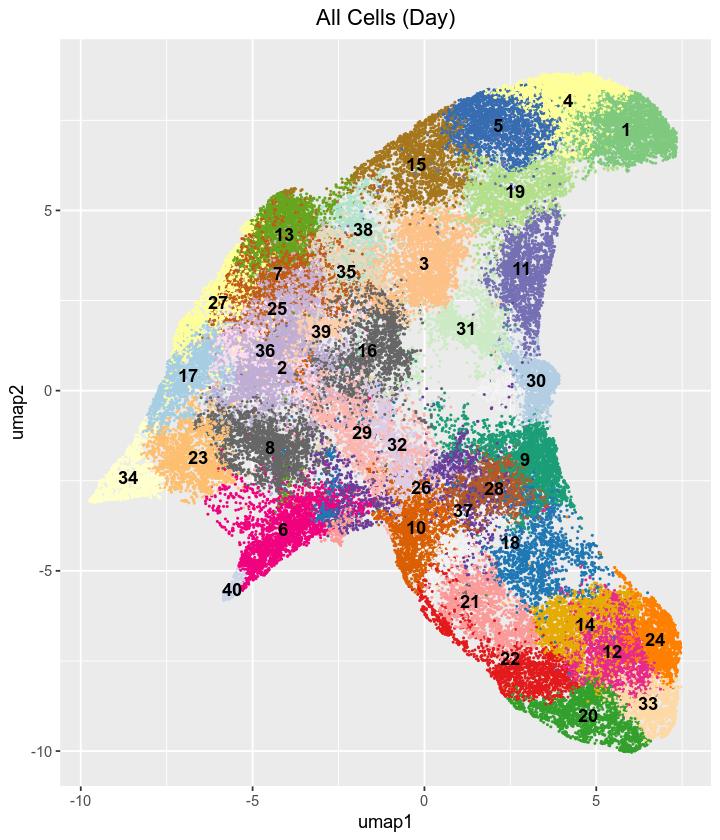

In [19]:
options(repr.plot.width = 6, repr.plot.height = 7)

df = data.frame(umap1=metaData$umap1, 
                umap2=metaData$umap2,
                clst=as.factor(clusters))
# shuffle so days don't overlap
df = df[sample(dim(df)[1]), ]

ggplot(df) +
# ggplot(df[df$x.sp.sample %in% c("D14"), ]) +
geom_point(size=0.2, alpha=1, aes(x=umap1 , y=umap2, col=clst)) +
# scale_color_brewer( palette = "Set1") +
scale_color_manual(values=col_vector) +
geom_text(data=data.frame(aggregate(metaData[,c("umap1","umap2")], 
                                    list(clusters), mean)),
         aes(x=umap1, y=umap2, label=Group.1), fontface = "bold") +
ggtitle("All Cells (Day)") + 
theme(plot.title = element_text(hjust = 0.5),
      legend.positio = "none")
# guides(colour = guide_legend(override.aes = list(shape=16, alpha=1, size=4))) 

## Make pseudo-bulk matrix

In [22]:
agg_matrix = sparseMatrix(i=clusters,
                         j=seq(1,nrow(pmat)),
                         x=1L,
                         dims=c(length(table(clusters)), nrow(pmat)))

In [23]:
cts = as.matrix(agg_matrix %*% pmat)
colnames(cts) = sub("_", "-", sub("_", ":", rownames(regions)))
rownames(cts) = paste("cluster", seq(1,nrow(cts)), sep="_")
cts = t(cts)
head(cts)
dim(cts)

,cluster_1,cluster_2,cluster_3,cluster_4,cluster_5,cluster_6,cluster_7,cluster_8,cluster_9,cluster_10,⋯,cluster_31,cluster_32,cluster_33,cluster_34,cluster_35,cluster_36,cluster_37,cluster_38,cluster_39,cluster_40
chr1:97145604-97145864,4,72,17,4,3,24,27,29,19,43,⋯,31,74,48,5,11,17,10,8,6,0
chr1:7538148-7538363,6,95,12,11,15,40,3,26,51,133,⋯,12,100,61,4,16,7,21,33,36,0
chr1:93196678-93196894,1,10,0,1,2,2,2,1,4,12,⋯,2,12,31,6,3,0,1,1,5,0
chr1:187577713-187577913,0,30,1,1,1,1,4,1,12,7,⋯,0,1,19,2,4,5,0,3,5,0
chr1:53278065-53278265,5,41,5,4,4,15,9,14,16,30,⋯,0,22,17,1,12,5,0,11,9,1
chr1:177176832-177177032,1,43,2,0,2,1,6,6,1,2,⋯,3,8,6,35,0,3,0,4,11,0


[1] 803958     40

In [24]:
cts = cts[rowSums(cts)>50, ]
dim(cts)

[1] 803416     40

In [25]:
norm_cts = t(t(cts)/estimateSizeFactorsForMatrix(cts))

In [26]:
log_norm_cts = log2(1+norm_cts)

## Clustering etc

In [ ]:
PLOT_CLSTS = colnames(norm_cts) #c("cluster_1", "cluster_10", "cluster_26", "cluster_6")
CLST_BASIS = PLOT_CLSTS
# CLST_BASIS = c("cluster_1", "cluster_10", "cluster_26")
cts_to_cluster = log2(1+200*(norm_cts/width(GRanges(rownames(norm_cts)))))
# cts_to_cluster = t(scale(t(log_norm_cts)))

In [ ]:
# ADD RAND SEED - not required

km_mb = MiniBatchKmeans(cts_to_cluster[,CLST_BASIS], 
                        batch_size = 1000,
                        clusters=15,
                        num_init = 10, 
                        verbose = FALSE)

In [ ]:
# reorder based on hierarchical clustering
# pr_mb = predict_MBatchKMeans(cts_to_cluster, km_mb$centroids)

# distance    = dist(t(scale(t(km_mb$centroids))))
# cluster     = hclust(distance, method="ward")
# dendrogram  = as.dendrogram(cluster)
# rowInd = rev(order.dendrogram(dendrogram))
# pr_mb = order(rowInd)[pr_mb]

In [ ]:
# no hierarchical clustering, follow order of km_mb$centroids
pr_mb = predict_MBatchKMeans(cts_to_cluster[, CLST_BASIS], km_mb$centroids)

In [ ]:
table(pr_mb)

In [ ]:
order(rowVars(km_mb$centroids))

In [ ]:
cts_clustered = cts_to_cluster[order(pr_mb),]
head(cts_clustered, 2)

In [ ]:
options(repr.plot.width = 5, repr.plot.height = 5)
hist(as.vector(cts_clustered))

In [ ]:
options(repr.plot.width = 10, repr.plot.height = 10)

idxs = seq(1, nrow(cts_clustered), 10) # if subsample
ggplot(data = melt(cts_clustered[idxs, ]), 
       mapping = aes(x = Var2,
                     y = Var1,
                     fill = value)) +
geom_tile()  + ylab(NULL) + xlab("Condition") +  
geom_raster(aes(fill=value)) +
scale_fill_viridis(limits=c(0, 7), oob=squish, option = "A") +
# scale_fill_viridis(option="A") + 
# scale_fill_gradient2(low="red", mid="black", high="blue") +
facet_grid(sort(pr_mb)[idxs] ~ ., switch = "y", scales = "free_y", space = "free_y")+
# theme_classic() +
theme(axis.text.x=element_text(angle=90,hjust=1),
      axis.text.y=element_blank(),
      axis.ticks.y=element_blank()) 
#       panel.spacing.y = unit(0.03, "cm"),
#       strip.text.y = element_text(size = 3))  
#       strip.background = element_rect(size = 0.1))

# ggsave(sprintf("figs/%s_tmp_heatmap_n%d.jpeg", format(Sys.Date(), format='%Y%m%d'), length(table(pr_mb))),
#        dpi=1000)

In [ ]:
CLUSTER_IDX = 1
NORM = 'tmp'
BED_PATH = sprintf("beds/%s_%s_n%d/idx%d.bed", format(Sys.Date(), format='%Y%m%d'), NORM, length(table(pr_mb)), CLUSTER_IDX)
# rownames(vsd_assay_to_cluster_normalized)[(which(pr_mb==CLUSTER_IDX))]
BED_PATH

In [361]:
for (i in seq(1,length(table(pr_mb)))){
BED_PATH = sprintf("beds/%s_%s_n%d/idx%d.bed", format(Sys.Date(), format='%Y%m%d'), NORM, length(table(pr_mb)), i)
fileConn = file(BED_PATH)
writeLines(sub('-', '\t', sub(':', '\t', rownames(cts_to_cluster)))[(which(pr_mb==i))], fileConn)
close(fileConn)}

In [362]:
ALL_PEAKS_BED_PATH = sprintf("beds/%s_%s_n%d/all_peaks.bed", format(Sys.Date(), format='%Y%m%d'), NORM, length(table(pr_mb)))
print(ALL_PEAKS_BED_PATH)
fileConn = file(ALL_PEAKS_BED_PATH)
writeLines(sub('-', '\t', sub(':', '\t', rownames(cts_to_cluster))), fileConn)
close(fileConn)

[1] "beds/20200328_tmp_n20/all_peaks.bed"


## Gene Scores

In [31]:
gencode.basic.hg38 = import.gff(gzfile("../../../resources/GENCODE/gencode.v33.chr_patch_hapl_scaff.basic.annotation.gtf.gz"))
gencode.basic.hg38 = keepStandardChromosomes(gencode.basic.hg38, pruning.mode = "coarse")
gencode.basic.tx.hg38 = subset(subset(gencode.basic.hg38, gene_type=="protein_coding"), type=="transcript")
head(gencode.basic.tx.hg38, 3)
length(gencode.basic.tx.hg38)

Warning message in readGFF(filepath, version = version, filter = filter):
“connection is not positioned at the start of the file, rewinding it”


GRanges object with 3 ranges and 21 metadata columns:
      seqnames        ranges strand |   source       type     score     phase
         <Rle>     <IRanges>  <Rle> | <factor>   <factor> <numeric> <integer>
  [1]     chr1   65419-71585      + |   HAVANA transcript      <NA>      <NA>
  [2]     chr1   69055-70108      + |  ENSEMBL transcript      <NA>      <NA>
  [3]     chr1 450703-451697      - |   HAVANA transcript      <NA>      <NA>
                gene_id      gene_type   gene_name       level     hgnc_id
            <character>    <character> <character> <character> <character>
  [1] ENSG00000186092.6 protein_coding       OR4F5           2  HGNC:14825
  [2] ENSG00000186092.6 protein_coding       OR4F5           3  HGNC:14825
  [3] ENSG00000284733.1 protein_coding      OR4F29           2  HGNC:31275
               havana_gene     transcript_id transcript_type transcript_name
               <character>       <character>     <character>     <character>
  [1] OTTHUMG00000001094.4 

[1] 58073

In [32]:
tx.hg38 = gencode.basic.tx.hg38

In [33]:
tss.hg38 = unique(resize(tx.hg38, width=1, fix='start'))
tss.hg38

GRanges object with 51948 ranges and 21 metadata columns:
          seqnames    ranges strand |   source       type     score     phase
             <Rle> <IRanges>  <Rle> | <factor>   <factor> <numeric> <integer>
      [1]     chr1     65419      + |   HAVANA transcript      <NA>      <NA>
      [2]     chr1     69055      + |  ENSEMBL transcript      <NA>      <NA>
      [3]     chr1    451697      - |   HAVANA transcript      <NA>      <NA>
      [4]     chr1    686673      - |   HAVANA transcript      <NA>      <NA>
      [5]     chr1    925731      + |   HAVANA transcript      <NA>      <NA>
      ...      ...       ...    ... .      ...        ...       ...       ...
  [51944]     chrM     10470      + |  ENSEMBL transcript      <NA>      <NA>
  [51945]     chrM     10760      + |  ENSEMBL transcript      <NA>      <NA>
  [51946]     chrM     12337      + |  ENSEMBL transcript      <NA>      <NA>
  [51947]     chrM     14673      - |  ENSEMBL transcript      <NA>      <NA>
  [519

In [34]:
prom.hg38 = promoters(tss.hg38, upstream = 100, downstream = 100)
prom.hg38

GRanges object with 51948 ranges and 21 metadata columns:
          seqnames        ranges strand |   source       type     score
             <Rle>     <IRanges>  <Rle> | <factor>   <factor> <numeric>
      [1]     chr1   65319-65518      + |   HAVANA transcript      <NA>
      [2]     chr1   68955-69154      + |  ENSEMBL transcript      <NA>
      [3]     chr1 451598-451797      - |   HAVANA transcript      <NA>
      [4]     chr1 686574-686773      - |   HAVANA transcript      <NA>
      [5]     chr1 925631-925830      + |   HAVANA transcript      <NA>
      ...      ...           ...    ... .      ...        ...       ...
  [51944]     chrM   10370-10569      + |  ENSEMBL transcript      <NA>
  [51945]     chrM   10660-10859      + |  ENSEMBL transcript      <NA>
  [51946]     chrM   12237-12436      + |  ENSEMBL transcript      <NA>
  [51947]     chrM   14574-14773      - |  ENSEMBL transcript      <NA>
  [51948]     chrM   14647-14846      + |  ENSEMBL transcript      <NA>
      

In [35]:
unique_prom_genes = names(table(prom.hg38$gene_name)[which(table(prom.hg38$gene_name)==1)])

In [36]:
intervals_gr = GRanges(rownames(cts))

### Promoters Only

Count reads in peaks +/-2kb from TSS, but only filter to those that have a peak within +/-100 of TSS.

In [38]:
tx_with_peak_at_prom = unique(tss.hg38[queryHits(findOverlaps(tss.hg38+100, intervals_gr))]$transcript_name)

In [39]:
tss.hg38[tss.hg38$transcript_name=="HP-202"]

GRanges object with 1 range and 21 metadata columns:
      seqnames    ranges strand |   source       type     score     phase
         <Rle> <IRanges>  <Rle> | <factor>   <factor> <numeric> <integer>
  [1]    chr16  72054505      + |   HAVANA transcript      <NA>      <NA>
                gene_id      gene_type   gene_name       level     hgnc_id
            <character>    <character> <character> <character> <character>
  [1] ENSG00000257017.9 protein_coding          HP           2   HGNC:5141
               havana_gene      transcript_id transcript_type transcript_name
               <character>        <character>     <character>     <character>
  [1] OTTHUMG00000173009.7 ENST00000355906.10  protein_coding          HP-202
      transcript_support_level         tag    havana_transcript exon_number
                   <character> <character>          <character> <character>
  [1]                        1        CCDS OTTHUMT00000421680.2        <NA>
          exon_id         ont        p

In [40]:
overlaps = findOverlaps(tss.hg38+2000, intervals_gr)
overlaps

Hits object with 248155 hits and 0 metadata columns:
           queryHits subjectHits
           <integer>   <integer>
       [1]         5        4725
       [2]         5       19084
       [3]         5       25318
       [4]         5       33570
       [5]         5       34322
       ...       ...         ...
  [248151]     51886      803251
  [248152]     51887      802565
  [248153]     51887      802637
  [248154]     51887      803026
  [248155]     51887      803251
  -------
  queryLength: 51948 / subjectLength: 803416

In [41]:
summed_gene = aggregate(cts[subjectHits(overlaps),], list(queryHits(overlaps)), sum)

rownames(summed_gene) = prom.hg38[summed_gene$Group.1]$transcript_name
summed_gene$Group.1 = NULL

In [42]:
dim(summed_gene)
summed_gene = summed_gene[rownames(summed_gene) %in% tx_with_peak_at_prom, ]
dim(summed_gene)

[1] 46672    40

[1] 40033    40

In [43]:
# DESeq2 normalize
summed_gene = as.data.frame(t(t(summed_gene)/estimateSizeFactorsForMatrix(summed_gene)))

head(summed_gene)

,cluster_1,cluster_2,cluster_3,cluster_4,cluster_5,cluster_6,cluster_7,cluster_8,cluster_9,cluster_10,⋯,cluster_31,cluster_32,cluster_33,cluster_34,cluster_35,cluster_36,cluster_37,cluster_38,cluster_39,cluster_40
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
SAMD11-202,307.0737,455.7901,416.3186,179.4097,241.0179,468.1032,408.2193,433.6976,612.6612,545.1564,⋯,541.9532,482.9964,431.3646,398.1338,427.4988,403.2052,511.0517,433.0146,430.4287,834.4500
SAMD11-213,307.0737,455.7901,416.3186,179.4097,241.0179,468.1032,408.2193,433.6976,612.6612,545.1564,⋯,541.9532,482.9964,431.3646,398.1338,427.4988,403.2052,511.0517,433.0146,430.4287,834.4500
NOC2L-201,486.3954,519.0197,465.5732,297.7438,322.1081,518.5453,471.1348,459.5527,583.3707,607.7757,⋯,488.1168,576.3577,574.7733,514.3152,494.7087,537.6070,491.5211,499.9917,498.7648,507.5520
KLHL17-201,486.3954,519.0197,465.5732,297.7438,322.1081,518.5453,471.1348,459.5527,583.3707,607.7757,⋯,488.1168,576.3577,574.7733,514.3152,494.7087,537.6070,491.5211,499.9917,498.7648,507.5520
KLHL17-205,486.3954,519.0197,465.5732,297.7438,322.1081,518.5453,471.1348,459.5527,583.3707,607.7757,⋯,488.1168,576.3577,574.7733,514.3152,494.7087,537.6070,491.5211,499.9917,498.7648,507.5520
PLEKHN1-203,237.9235,382.5512,200.5366,177.5011,203.8516,523.9258,255.3199,496.2501,371.0140,595.1466,⋯,346.3476,472.7428,392.6669,287.6198,279.8575,389.1399,527.3272,327.8762,446.4034,516.1546


### Gene Body

In [44]:
overlaps = findOverlaps(tx.hg38+2000, intervals_gr)
overlaps

Hits object with 1517771 hits and 0 metadata columns:
            queryHits subjectHits
            <integer>   <integer>
        [1]         5        1649
        [2]         5        3047
        [3]         5        4725
        [4]         5        9614
        [5]         5       13345
        ...       ...         ...
  [1517767]     58004      802565
  [1517768]     58004      802637
  [1517769]     58004      803026
  [1517770]     58004      803102
  [1517771]     58004      803251
  -------
  queryLength: 58073 / subjectLength: 803416

In [45]:
gene_body_summed = aggregate(cts[subjectHits(overlaps),], list(queryHits(overlaps)), sum)

rownames(gene_body_summed) = tx.hg38[gene_body_summed$Group.1]$transcript_name
gene_body_summed$Group.1 = NULL

# only keep those with a peak at the TSS
gene_body_summed = gene_body_summed[rownames(gene_body_summed) %in% rownames(summed_gene), ]

# DESeq2 normalize
gene_body_summed = as.data.frame(t(t(gene_body_summed)/estimateSizeFactorsForMatrix(gene_body_summed)))

head(gene_body_summed)

,cluster_1,cluster_2,cluster_3,cluster_4,cluster_5,cluster_6,cluster_7,cluster_8,cluster_9,cluster_10,⋯,cluster_31,cluster_32,cluster_33,cluster_34,cluster_35,cluster_36,cluster_37,cluster_38,cluster_39,cluster_40
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
SAMD11-202,922.4852,1651.0748,1467.9157,695.4434,838.3172,1984.1483,1374.5204,1709.0003,2022.7626,1798.1597,⋯,1898.8333,1691.9912,1798.1740,1512.8415,1386.7740,1459.6516,1828.1152,1254.8562,1403.6664,3025.194
SAMD11-213,922.4852,1651.0748,1467.9157,695.4434,838.3172,1984.1483,1374.5204,1709.0003,2022.7626,1798.1597,⋯,1898.8333,1691.9912,1798.1740,1512.8415,1386.7740,1459.6516,1828.1152,1254.8562,1403.6664,3025.194
NOC2L-201,705.2157,924.3719,784.1271,485.8309,486.3607,977.5593,728.4028,924.8909,1201.6411,1082.2257,⋯,884.7676,1068.3109,1185.4672,832.6492,784.1678,878.8966,1036.2578,726.5792,859.5290,1134.448
KLHL17-201,750.1261,884.8381,703.6086,487.7899,531.9214,1046.4205,710.5147,977.7905,978.8369,1189.4077,⋯,858.9080,1057.9707,998.6592,737.5265,783.0539,920.8228,1019.9644,843.1809,922.7807,1022.722
KLHL17-205,750.1261,884.8381,703.6086,487.7899,531.9214,1046.4205,710.5147,977.7905,978.8369,1189.4077,⋯,858.9080,1057.9707,998.6592,737.5265,783.0539,920.8228,1019.9644,843.1809,922.7807,1022.722
PLEKHN1-203,367.7803,519.6896,388.9667,282.0953,304.1178,783.1276,394.9689,735.4759,504.0217,758.5986,⋯,506.1093,637.2858,574.5227,491.2500,419.9308,585.4135,638.6998,469.5796,583.1281,1220.391


### Inverse Distance Model

In [46]:
distal_overlaps = findOverlaps(tss.hg38+100000, intervals_gr)
distal_overlaps

Hits object with 4213532 hits and 0 metadata columns:
            queryHits subjectHits
            <integer>   <integer>
        [1]         1        9874
        [2]         1       11646
        [3]         1       18644
        [4]         1       25716
        [5]         1       29465
        ...       ...         ...
  [4213528]     51887      803383
  [4213529]     51900      802655
  [4213530]     51900      803068
  [4213531]     51917      802536
  [4213532]     51918      802536
  -------
  queryLength: 51948 / subjectLength: 803416

In [56]:
distal_summed_gene = cts[subjectHits(distal_overlaps),]

gene_peak_coeff = 1000*(1+abs(mid(intervals_gr[subjectHits(distal_overlaps)]) - start(tss.hg38[queryHits(distal_overlaps)])))^(-0.7)

distal_summed_gene = aggregate(gene_peak_coeff * distal_summed_gene, list(queryHits(distal_overlaps)), sum)

# remove transcripts with duplicate entries (e.g. CD99-201 that is on chrY and chrX)
tx_names = prom.hg38[distal_summed_gene$Group.1]$transcript_name
distal_summed_gene = distal_summed_gene[!duplicated(tx_names), ]
rownames(distal_summed_gene) = tx_names[!duplicated(tx_names)]
distal_summed_gene$Group.1 = NULL

# only keep those with a peak at the TSS
distal_summed_gene = distal_summed_gene[rownames(distal_summed_gene) %in% rownames(summed_gene), ]

# DESeq2 normalize
distal_summed_gene = as.data.frame(t(t(distal_summed_gene)/estimateSizeFactorsForMatrix(distal_summed_gene)))

head(distal_summed_gene, 2)

,cluster_1,cluster_2,cluster_3,cluster_4,cluster_5,cluster_6,cluster_7,cluster_8,cluster_9,cluster_10,⋯,cluster_31,cluster_32,cluster_33,cluster_34,cluster_35,cluster_36,cluster_37,cluster_38,cluster_39,cluster_40
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
SAMD11-202,8101.496,12809.93,10412.88,5520.586,6941.995,14088.34,12505.66,11892.69,14370.74,12466.20,⋯,12901.62,11821.80,11048.73,12420.36,11884.33,11227.15,11734.03,11881.81,11445.80,24049.89
SAMD11-213,7899.987,12419.84,10159.55,5432.343,6773.880,13661.96,12129.79,11586.84,13955.79,12147.19,⋯,12536.60,11533.15,10763.15,12008.42,11587.45,10915.87,11437.17,11504.93,11092.44,23231.45


In [57]:
genes_done = read.table("../../../genes_analysed.txt")
genes_done = as.character(genes_done$V1)

In [137]:
cur_diff_peaks_subset = cur_diff_peaks[!duplicated(lapply(strsplit(cur_diff_peaks, "-"), "[[", 1))]
cur_diff_peaks_subset = cur_diff_peaks_subset[!lapply(strsplit(cur_diff_peaks_subset, "-"), "[[", 1) %in% genes_done]
cur_diff_peaks_subset = cur_diff_peaks_subset[rowMaxs(as.matrix(distal_summed_gene[cur_diff_peaks_subset,]))==
                                              distal_summed_gene[cur_diff_peaks_subset, "cluster_34"]]

In [138]:
sum(which(lapply(strsplit(cur_diff_peaks_subset, "-"), "[[", 1) %in%  genes_done)<100)

[1] 0

In [139]:
tail(head(cur_diff_peaks_subset, 50), 50)

[1] "TAF11L11-201" "RXFP1-203"    "KRTAP3-2-201" "EPDR1-204"    "GPR141-202"  
 [6] "MALRD1-204"   "ZNF727-201"   "AADACL2-201"  "TAF11L12-201" "IL1RL1-204"  
[11] "ARHGAP32-202" "NKX2-8-201"   "APCS-201"     "STMN2-203"    "GABRA3-201"  
[16] "TAS2R30-201"  "CD2-202"      "KLRB1-201"    "TAS2R50-201"  "FGA-203"     
[21] "GPR1-210"     "MOB2-201"     "EYS-211"      "ANKS1B-213"   "SMARCAD1-206"
[26] "PRB2-201"     "C1QTNF9-201"  "OMD-201"      "ANXA13-201"   "RGPD2-201"   
[31] "TRIM29-213"   "POF1B-202"    "COL4A4-201"   "FLG-201"      "GALNT8-202"  
[36] "DEFB134-202"  "MYRFL-202"    "ZFAT-208"     "SRY-201"      "PWWP3B-203"  
[41] "MTUS1-203"    "CACNA2D3-202" "HMGCS2-201"   "LFNG-205"     "PTH-202"     
[46] "MYSM1-207"    "TEX11-203"    "ZNF107-203"   "SOSTDC1-201"  "TMEM132C-201"

In [105]:
GENE = "RXFP1-203"

In [149]:
query = "^NR1D1-"
rownames(summed_gene)[grepl(query, rownames(summed_gene))]
GENE = rownames(summed_gene)[grepl(query, rownames(summed_gene))][1]

[1] "NR1D1-201"

In [150]:
# distal_summed_gene[GENE, ]
summed_gene[GENE, ]

,cluster_1,cluster_2,cluster_3,cluster_4,cluster_5,cluster_6,cluster_7,cluster_8,cluster_9,cluster_10,⋯,cluster_31,cluster_32,cluster_33,cluster_34,cluster_35,cluster_36,cluster_37,cluster_38,cluster_39,cluster_40
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
NR1D1-201,723.1469,1143.747,874.8555,666.1064,649.8474,1172.948,967.8747,1306.097,1279.022,1364.47,⋯,904.4517,1205.602,1275.314,1136.311,1055.525,1097.093,1113.246,920.5454,1077.403,1290.387


In [151]:
max(distal_summed_gene[GENE, ])/median(unlist(distal_summed_gene[GENE, ]))
max(summed_gene[GENE, ])/median(unlist(summed_gene[GENE, ]))
max(gene_body_summed[GENE, ])/median(unlist(gene_body_summed[GENE, ]))

gid_txn = unlist(strsplit(GENE, ":"))
as.character(prom.hg38[prom.hg38$transcript_name==GENE]+1000)

[1] 1.212616

[1] 1.203392

[1] 1.695383

[1] "chr17:40099490-40101689:-"

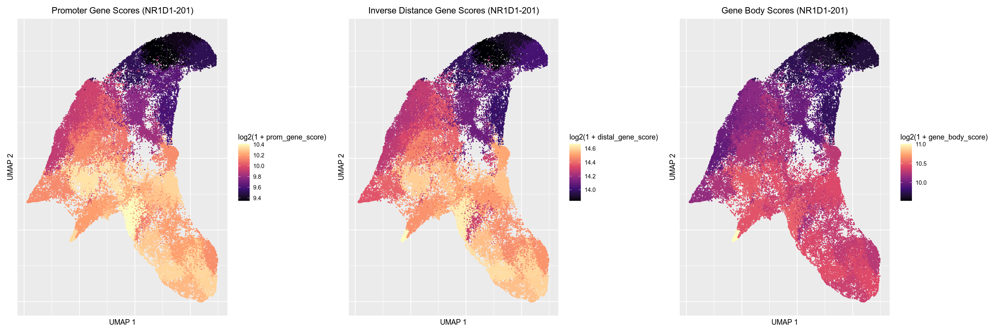

In [152]:
options(repr.plot.width = 21, repr.plot.height = 7)

df = data.frame(umap1=metaData$umap1, 
                umap2=metaData$umap2,
                distal_gene_score=as.numeric(distal_summed_gene[GENE, ])[clusters],
                prom_gene_score=as.numeric(summed_gene[GENE, ])[clusters],
                gene_body_score=as.numeric(gene_body_summed[GENE, ])[clusters])
# shuffle so days don't overlap
df = df[sample(dim(df)[1]), ]

p1 = ggplot(df) +
# ggplot(df[df$x.sp.sample %in% c("D14"), ]) +
geom_point(size=0.2, alpha=1, aes(x=umap1 , y=umap2, col=log2(1+prom_gene_score))) +
ggtitle(sprintf("Promoter Gene Scores (%s)", GENE)) + 
xlab("UMAP 1") + ylab("UMAP 2") +
scale_color_viridis_c(oob=squish, option = "A") +
theme(plot.title = element_text(hjust = 0.5),
     axis.ticks = element_blank(),
     axis.text =element_blank())

p2 = ggplot(df) +
# ggplot(df[df$x.sp.sample %in% c("D14"), ]) +
geom_point(size=0.2, alpha=1, aes(x=umap1 , y=umap2, col=log2(1+distal_gene_score))) +
ggtitle(sprintf("Inverse Distance Gene Scores (%s)", GENE)) + 
xlab("UMAP 1") + ylab("UMAP 2") +
scale_color_viridis_c(oob=squish, option = "A") +
theme(plot.title = element_text(hjust = 0.5),
     axis.ticks = element_blank(),
     axis.text =element_blank())

p3 = ggplot(df) +
# ggplot(df[df$x.sp.sample %in% c("D14"), ]) +
geom_point(size=0.2, alpha=1, aes(x=umap1 , y=umap2, col=log2(1+gene_body_score))) +
ggtitle(sprintf("Gene Body Scores (%s)", GENE)) + 
xlab("UMAP 1") + ylab("UMAP 2") +
scale_color_viridis_c(oob=squish, option = "A") +
theme(plot.title = element_text(hjust = 0.5),
     axis.ticks = element_blank(),
     axis.text =element_blank())

p1 | p2 | p3

## Cell State Dissection - Playground

In [53]:
# load bulk RNA-seq data
fpkm = read.table("/users/surag/kundajelab/scATAC-reprog/resources/GSE62777/RNAseq.FPKM.tsv", sep='\t', header=T)
fpkm$gene_id = NULL
fpkm$locus=NULL
tpm = fpkm
tpm[,2:ncol(tpm)] = 1e6*t(t(tpm[,2:ncol(tpm)])/colSums(tpm[,2:ncol(tpm)]))

# removing genes with dup names
tpm = tpm[!duplicated(tpm$gene_short_name),]
rownames(tpm) = tpm$gene_short_name
tpm$gene_short_name = NULL

tpm["GAPDH",]

,hiF.T_P14,X2dd_DOX_plus,X5dd_DOX_plus,X8dd_DOX_plus,X10dd_DOX_plus_SSEA3_pos,X14dd_DOX_plus_SSEA3_pos,X20dd_DOX_plus_TRA_plus,X24dd_TRA_pos_DOX_plus,X24dd_TRA_pos_DOX_minus,hIPSC.T_P10
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
GAPDH,7803.64,4963.505,3908.693,3839.776,3795.548,3364.503,3032.412,3790.955,5598.224,4731.256


In [153]:
data.use = norm_cts
group = factor(colnames(data.use), levels = colnames(data.use))
y = DGEList(counts=data.use, group=group)

In [154]:
design <- model.matrix(~0+group, data=y$samples)
colnames(design) <- levels(y$samples$group)

In [155]:
fit <- glmFit(y, design, dispersion = 0.4^2)

In [224]:
# contrast vector (one/many-vs-rest)
many = c("cluster_1")
cont = rep(-1/(ncol(data.use)-length(many)),ncol(data.use))
cont[(group %in% many)] = 1/length(many)

In [256]:
# contrast vector (one/many-vs-one/many)
pos = c("cluster_6")
neg = c("cluster_30") 
cont = rep(0,ncol(data.use))
cont[(group %in% pos)] = 1/length(pos)
cont[(group %in% neg)] = -1/length(neg)

In [225]:
# one-vs-all for a cluster
lrt <- glmLRT(fit, contrast=cont)

In [226]:
cur_diff_peaks = rownames(lrt$table[order((1/lrt$table$PValue)*ifelse(lrt$table$logFC>0, -1, 1)),])  

In [227]:
head(cur_diff_peaks, 40)

[1] "chr4:92256911-92257211"    "chr8:1658078-1658378"     
 [3] "chr7:37491979-37492191"    "chr13:57286582-57286814"  
 [5] "chr14:99174628-99174853"   "chr11:23730393-23730639"  
 [7] "chr19:54893527-54893827"   "chr19:22427629-22427851"  
 [9] "chr5:18652451-18652744"    "chr6:140148310-140148540" 
[11] "chr7:84880526-84880735"    "chr6:170007142-170007380" 
[13] "chr5:12323728-12324015"    "chr5:12662070-12662316"   
[15] "chr19:22422302-22422530"   "chr8:88592041-88592297"   
[17] "chr19:22832150-22832358"   "chr7:69645798-69646078"   
[19] "chr19:54881381-54881595"   "chr7:51327360-51327618"   
[21] "chr8:80211820-80212044"    "chr12:38056654-38056934"  
[23] "chr19:22286222-22286522"   "chr16:9669941-9670241"    
[25] "chr5:18652872-18653072"    "chr7:102248745-102248985" 
[27] "chr19:22784087-22784299"   "chr5:12661580-12661798"   
[29] "chr5:106154269-106154480"  "chr4:115678609-115678870" 
[31] "chr3:27463609-27463836"    "chr13:56735599-56735826"  
[33] "chr19:53789513-53789737"   "chr7:76673484-76673703"   
[35] "chr12:113587763-113587976" "chr2:78779193-78779412"   
[37] "chr19:52522650-52522856"   "chr5:18653272-18653472"   
[39] "chr9:117687559-117687859"  "chr13:22848559-22848809"

In [85]:
# should be max in that cluster
head(cur_diff_peaks[rowMaxs(as.matrix(data.use[cur_diff_peaks, ])) == data.use[cur_diff_peaks, "cluster_34"]], 40)

[1] "TSPAN8-201"   "ARNT2-207"    "ZHX3-201"     "MEF2C-239"    "TESPA1-203"  
 [6] "RXFP1-203"    "RXFP1-211"    "VIT-208"      "LUC7L-203"    "KRTAP3-2-201"
[11] "ZHX3-218"     "ADGRL4-204"   "RXFP1-201"    "ZHX3-217"     "CDH2-202"    
[16] "MALRD1-204"   "RIPOR2-209"   "HSD17B2-201"  "ARNT2-204"    "ADH7-201"    
[21] "VIT-205"      "C12orf49-204" "AADACL2-201"  "MAGI2-234"    "CEP112-201"  
[26] "SCEL-205"     "DZANK1-202"   "MAGI2-204"    "CLC-201"      "TESPA1-210"  
[31] "TESPA1-212"   "VIT-206"      "RIPOR2-214"   "CLDN22-201"   "IL1RL1-204"  
[36] "IL31RA-206"   "ZHX3-205"     "AEBP2-209"    "DMD-202"      "ADH7-205"

In [2220]:
# cur_diff_peaks = rownames(summed_gene)[rev(order(summed_gene[,"cluster_1"]/rowMeans(summed_gene)))]

In [904]:
grep("EVI2B", unique(lapply(strsplit(cur_diff_peaks, "-"), "[[", 1)))

[1] 31

In [442]:
# filter to those with unique TSS
head(cur_diff_peaks[lapply(strsplit(cur_diff_peaks, "-"), "[[", 1) %in% unique_prom_genes], 40)

[1] "ZNF723-201"   "ZNF727-201"   "RPL10L-201"   "BOD1L2-201"   "H3Y1-201"    
 [6] "FUT9-201"     "RBMXL2-201"   "DCAF12L1-201" "RGPD4-201"    "F13A1-201"   
[11] "SPACA1-201"   "FAAH2-201"    "KHDRBS2-201"  "TEX13C-201"   "MAGEE2-201"  
[16] "DCAF12L2-201" "POU3F4-201"   "TCL1B-201"    "DRD5-201"     "ADAMTS18-201"
[21] "DPPA2-201"    "ZNF728-201"   "TACR3-201"    "GJB7-203"     "ANKRD30B-202"
[26] "PCDHB4-201"   "GPR26-201"    "MTMR8-201"    "CAPN13-201"   "HTR1A-201"   
[31] "SLCO4C1-201"  "FAM135B-204"  "NPAP1-201"    "GPR139-202"   "TMEM132C-201"
[36] "PCDHA8-201"   "PPP1R2B-201"  "LUZP4-201"    "GK2-201"      "IZUMO2-201"

In [2384]:
# RNA-seq filter
cur_genes = lapply(strsplit(cur_diff_peaks, "-"), "[[", 1)
tpm_subset = data.frame(tpm[unlist(cur_genes[cur_genes %in% rownames(tpm)]), ])

rna_genes_subset = rownames(tpm_subset)[tpm_subset[,1]>1]
length(rna_genes_subset)

# For keratinocytes: initial increase-- rownames(tpm_subset)[((apply(tpm_subset[,c(1,1)], 1, max)<apply(tpm_subset[,2:3], 1, max)))]
# For immune response in non-OSKM: rownames(tpm_subset)[((apply(tpm_subset, 1, max)==apply(tpm_subset[,1:3], 1, max))  & (apply(tpm_subset, 1, max)>1))]

[1] 27141

In [2385]:
head(cur_diff_peaks[lapply(strsplit(cur_diff_peaks, "-"), "[[", 1) %in% rna_genes_subset], 40)

[1] "SNRNP40-202" "FLT1-208"    "CLDN22-201"  "ANO7-203"    "ZNF107-203" 
 [6] "SLCO1A2-201" "ZNF322-205"  "VASH1-204"   "EHMT1-216"   "EHMT1-211"  
[11] "IPO11-203"   "ZNF567-204"  "TIAF1-201"   "MBNL3-212"   "MBNL3-206"  
[16] "ATP1A1-203"  "IDI2-201"    "ZDBF2-202"   "KCNK1-202"   "CLSTN3-202" 
[21] "PPP1CC-204"  "SCML2-205"   "ASAP3-209"   "NBPF12-206"  "FOXP2-227"  
[26] "NFATC4-212"  "CD70-201"    "GALNT11-201" "MDM4-202"    "CAPZA2-214" 
[31] "CAPG-201"    "CAPG-205"    "CD70-202"    "GSDMB-202"   "GSDMB-203"  
[36] "EPHB1-211"   "LIME1-206"   "PTGFRN-201"  "FGF12-207"   "AUTS2-202"

In [2058]:
(cur_diff_peaks)[200]

[1] "FAM187A:NM_001258400"

In [464]:
GENE = "MYO3A-207"

In [89]:
query = "^ARGFX-"
rownames(data.use)[grepl(query, rownames(data.use))]
GENE = rownames(data.use)[grepl(query, rownames(data.use))][1]

[1] "ARGFX-201" "ARGFX-202"

In [90]:
min(as.numeric(data.use[GENE, ]))
median(as.numeric(data.use[GENE, ]))
max(as.numeric(data.use[GENE, ]))
max(as.numeric(data.use[GENE, ]))/min(as.numeric(data.use[GENE, ]))
# data.use[GENE, ]

as.character(prom.hg38[prom.hg38$transcript_name==GENE, ]+1000)

[1] 697.6677

[1] 3101.3

[1] 21088.05

[1] 30.22649

[1] "chr3:121566849-121569048:+"

In [91]:
options(repr.plot.width = 7, repr.plot.height = 7)

df = data.frame(x.sp@umap, gene_score=as.numeric(data.use[GENE, ])[clusters])
# shuffle so days don't overlap
df = df[sample(dim(df)[1]), ]

ggplot(df) +
# ggplot(df[df$x.sp.sample %in% c("D14"), ]) +
geom_point(size=0.2, alpha=1, aes(x=umap.1 , y=umap.2, col=log2(1+gene_score))) +
ggtitle(sprintf("Gene Scores (%s)", GENE)) + 
xlab("UMAP 1") + ylab("UMAP 2") +
scale_color_viridis_c(oob=squish, option = "A") +
theme(plot.title = element_text(hjust = 0.5),
     axis.ticks = element_blank(),
     axis.text =element_blank())

ERROR: Error in data.frame(x.sp@umap, gene_score = as.numeric(data.use[GENE, : object 'x.sp' not found


In [1467]:
ALL_PEAKS_BED_PATH = "tmp.txt"
fileConn = file(ALL_PEAKS_BED_PATH)

# write genes not in cur_diff_peaks
cur_genes = lapply(strsplit(cur_diff_peaks, "-"), "[[", 1)
# cur_genes = rna_genes_subset
remaining_genes = prom.hg38$gene_name[!prom.hg38$gene_name %in% cur_genes]
writeLines(unique(c(unlist(cur_genes), remaining_genes))[1:1000], fileConn)
# writeLines(unique(c(unlist(cur_genes))), fileConn)
# writeLines(sub("-", "\t", sub(":", "\t", (cur_diff_peaks)[1:10000])), fileConn)

close(fileConn)

In [228]:
ALL_PEAKS_BED_PATH = "tmp.bed"
fileConn = file(ALL_PEAKS_BED_PATH)

peaks_to_write = sub("-", "\t", sub(":", "\t", cur_diff_peaks[1:10000]))
writeLines(unique(peaks_to_write), fileConn)

close(fileConn)

In [1594]:
ALL_PEAKS_BED_PATH = "tmp_all.txt"
fileConn = file(ALL_PEAKS_BED_PATH)
writeLines(edb.genes.hg38$gene_name, fileConn)
close(fileConn)

## Locus Level Analyses (Vignettes)
Analyses a bunch of gene clusters or regions to see aggregate signal in them. Usually doesn't work at single-cell level because regions are not large enough.

In [163]:
peaks_gr = GRanges(rownames(norm_cts))

### Type I Keratin Gene Cluster

Rough coordinates chr17:40801459-41629596. 

In [173]:
region = "chr17:40801459-41629596"
region_gr = GRanges(c(region))

In [174]:
norm_reads_in_region = colSums(norm_cts[unique(queryHits(findOverlaps(peaks_gr, region_gr))), ])

In [175]:
max(norm_reads_in_region)
median(norm_reads_in_region)
min(norm_reads_in_region)
max(norm_reads_in_region)/min(norm_reads_in_region)

[1] 7593.605

[1] 4392.598

[1] 2626.059

[1] 2.891636

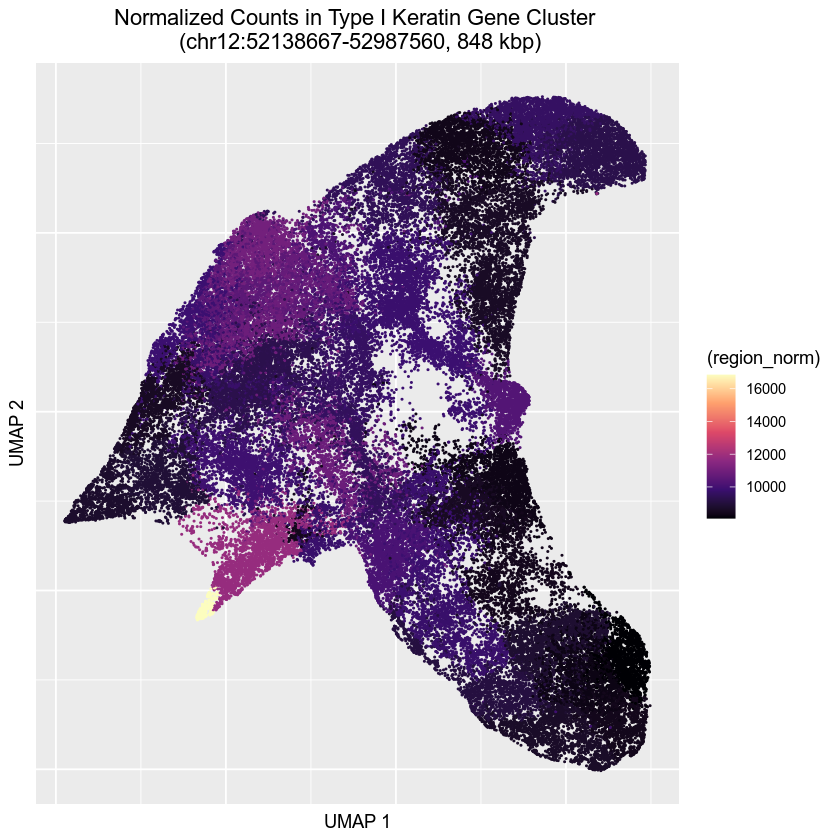

In [181]:
options(repr.plot.width = 7, repr.plot.height = 7)

df = data.frame(umap1=metaData$umap1, 
                umap2=metaData$umap2,
                region_norm=norm_reads_in_region[clusters])
# shuffle so days don't overlap
df = df[sample(dim(df)[1]), ]

ggplot(df) +
# ggplot(df[df$x.sp.sample %in% c("D14"), ]) +
geom_point(size=0.2, alpha=1, aes(x=umap1 , y=umap2, col=log2(region_norm))) +
ggtitle(sprintf("Normalized Counts in Type I Keratin Gene Cluster \n (%s, %d kbp)", region, 
               as.integer(width(region_gr)/1000))) + 
xlab("UMAP 1") + ylab("UMAP 2") +
scale_color_viridis_c(oob=squish, option = "A") +
theme(plot.title = element_text(hjust = 0.5),
     axis.ticks = element_blank(),
     axis.text =element_blank())

### Type II Keratin Gene Cluster

In [177]:
region = "chr12:52138667-52987560"
region_gr = GRanges(c(region))

In [178]:
norm_reads_in_region = colSums(norm_cts[unique(queryHits(findOverlaps(peaks_gr, region_gr))), ])

In [179]:
max(norm_reads_in_region)
median(norm_reads_in_region)
min(norm_reads_in_region)
max(norm_reads_in_region)/min(norm_reads_in_region)

[1] 16848.31

[1] 9553.73

[1] 8079.304

[1] 2.085367

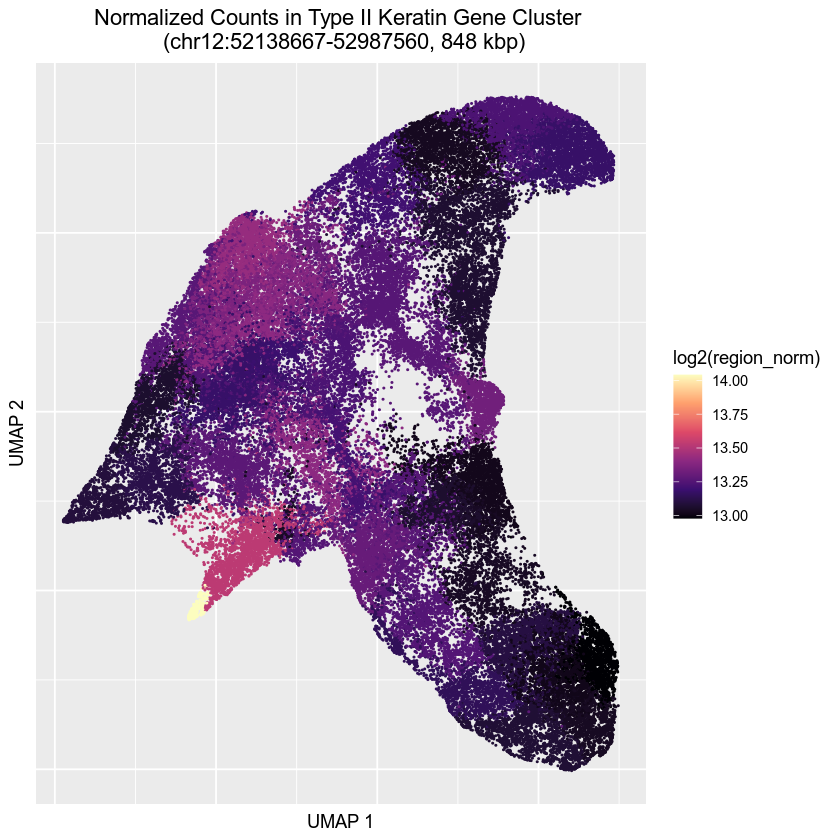

In [180]:
options(repr.plot.width = 7, repr.plot.height = 7)

df = data.frame(umap1=metaData$umap1, 
                umap2=metaData$umap2,
                region_norm=norm_reads_in_region[clusters])
# shuffle so days don't overlap
df = df[sample(dim(df)[1]), ]

ggplot(df) +
# ggplot(df[df$x.sp.sample %in% c("D14"), ]) +
geom_point(size=0.2, alpha=1, aes(x=umap1 , y=umap2, col=log2(region_norm))) +
ggtitle(sprintf("Normalized Counts in Type II Keratin Gene Cluster \n (%s, %d kbp)", region, 
               as.integer(width(region_gr)/1000))) + 
xlab("UMAP 1") + ylab("UMAP 2") +
scale_color_viridis_c(oob=squish, option = "A") +
theme(plot.title = element_text(hjust = 0.5),
     axis.ticks = element_blank(),
     axis.text =element_blank())

### Type 1 Interferon Locus

In [182]:
region = "chr9:21053568-21498318"
region_gr = GRanges(c(region))

In [183]:
norm_reads_in_region = colSums(norm_cts[unique(queryHits(findOverlaps(peaks_gr, region_gr))), ])

In [184]:
max(norm_reads_in_region)
median(norm_reads_in_region)
min(norm_reads_in_region)
max(norm_reads_in_region)/min(norm_reads_in_region)

[1] 4249.963

[1] 1843.784

[1] 1232.43

[1] 3.448442

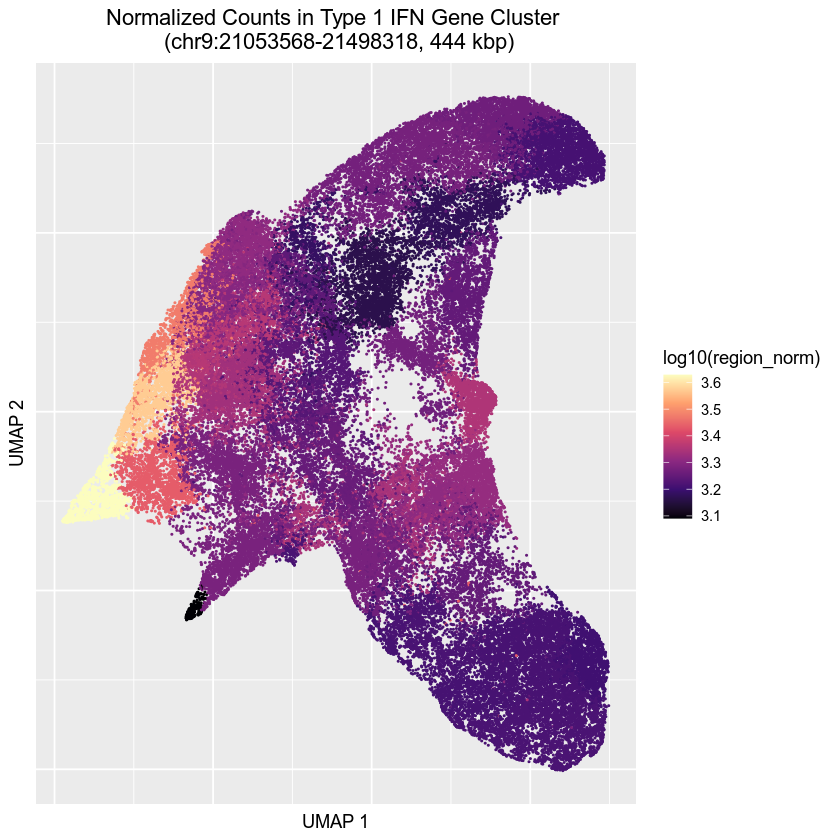

In [186]:
options(repr.plot.width = 7, repr.plot.height = 7)

df = data.frame(umap1=metaData$umap1, 
                umap2=metaData$umap2,
                region_norm=norm_reads_in_region[clusters])
# shuffle so days don't overlap
df = df[sample(dim(df)[1]), ]

ggplot(df) +
# ggplot(df[df$x.sp.sample %in% c("D14"), ]) +
geom_point(size=0.2, alpha=1, aes(x=umap1 , y=umap2, col=log10(region_norm))) +
ggtitle(sprintf("Normalized Counts in Type 1 IFN Gene Cluster \n (%s, %d kbp)", region, 
               as.integer(width(region_gr)/1000))) + 
xlab("UMAP 1") + ylab("UMAP 2") +
scale_color_viridis_c(oob=squish, option = "A") +
theme(plot.title = element_text(hjust = 0.5),
     axis.ticks = element_blank(),
     axis.text =element_blank())

### Promoters of Olfactory Receptor Genes

In [187]:
prom.hg38 = promoters(genes.hg38, upstream = 2000, downstream = 500)
seqlevels(prom.hg38) = paste("chr", seqlevels(prom.hg38), sep='')

ERROR: Error in promoters(genes.hg38, upstream = 2000, downstream = 500): object 'genes.hg38' not found


In [1617]:
region_gr = prom.hg38[(grepl("^OR[0-9]", prom.hg38$gene_name)),]

In [1367]:
# total olfactory receptors 
length(region_gr)

# those that intersect with any peaks
length(unique(subjectHits(findOverlaps(peaks_gr, region_gr))))

[1] 471

[1] 35

In [1626]:
norm_reads_in_region = colSums(norm_cts[unique(queryHits(findOverlaps(peaks_gr, region_gr))), ])

In [1627]:
max(norm_reads_in_region)
median(norm_reads_in_region)
min(norm_reads_in_region)
max(norm_reads_in_region)/min(norm_reads_in_region)

[1] 1344.773

[1] 423.642

[1] 287.719

[1] 4.673912

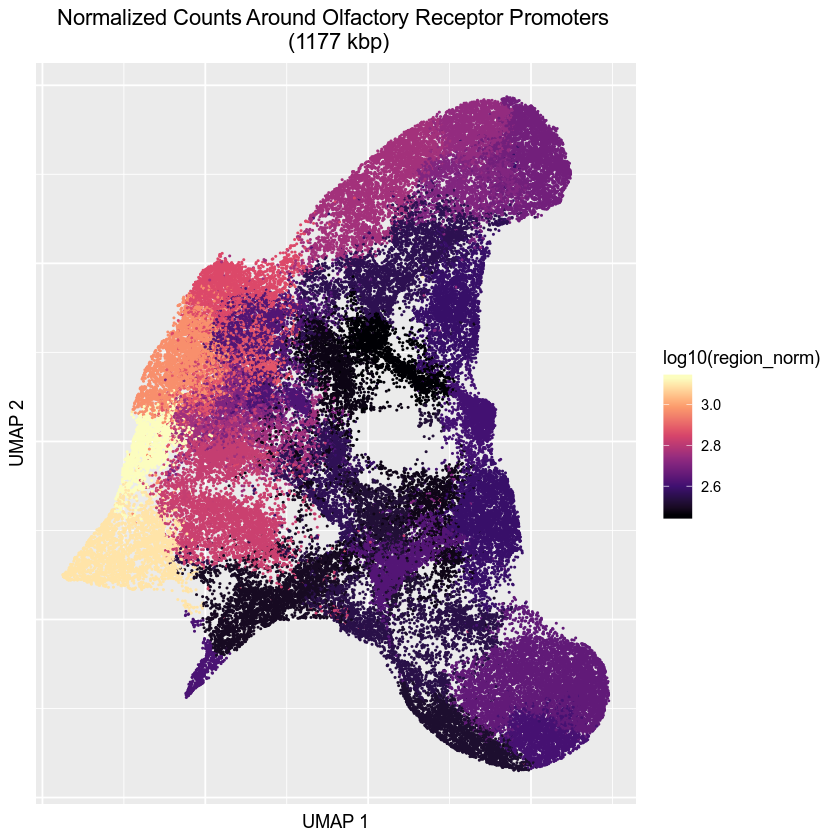

In [1628]:
options(repr.plot.width = 7, repr.plot.height = 7)

df = data.frame(x.sp@umap, region_norm=norm_reads_in_region[clusters])
# shuffle so days don't overlap
df = df[sample(dim(df)[1]), ]

ggplot(df) +
# ggplot(df[df$x.sp.sample %in% c("D14"), ]) +
geom_point(size=0.2, alpha=1, aes(x=umap.1 , y=umap.2, col=log10(region_norm))) +
ggtitle(sprintf("Normalized Counts Around Olfactory Receptor Promoters \n (%d kbp)", 
               as.integer(sum(width(region_gr))/1000))) + 
xlab("UMAP 1") + ylab("UMAP 2") +
scale_color_viridis_c(oob=squish, option = "A") +
theme(plot.title = element_text(hjust = 0.5),
     axis.ticks = element_blank(),
     axis.text =element_blank())

### Soufi et al "DBR" Heterochromatin Regions

These were regions identified in Soufi et al 2012 that were recfractory to OSKM binding in fibroblasts and are marked by H3K9me3, and are required for reprogramming. This can be done at single-cell level since it is 500 Mbp combined.

In [190]:
pmatRowSums = Matrix::rowSums(pmat)

In [200]:
region_gr = read.table("../../../resources/GSE36570/DBRs.hg38.bed")
colnames(region_gr) = c("chr", "start", "end")
region_gr = makeGRangesFromDataFrame(region_gr)

In [202]:
norm_reads_in_region = Matrix::rowSums(pmat[, unique(queryHits(findOverlaps(pmat_regions_gr, region_gr)))])/pmatRowSums

In [ ]:
max(norm_reads_in_region)
median(norm_reads_in_region)
min(norm_reads_in_region)
max(norm_reads_in_region)/min(norm_reads_in_region)

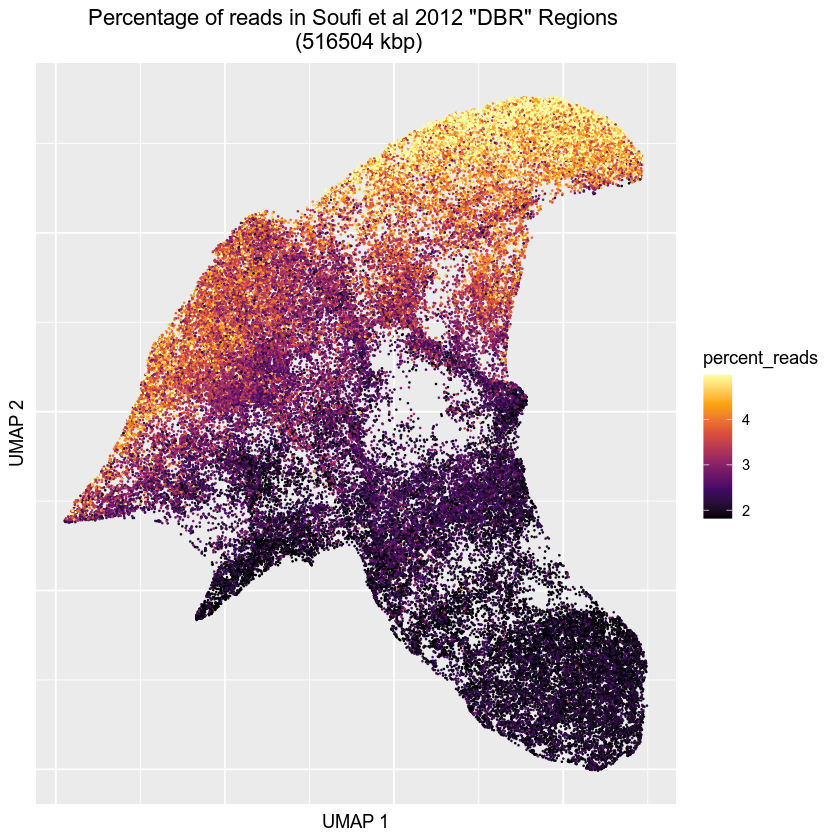

In [203]:
options(repr.plot.width = 7, repr.plot.height = 7)

df = data.frame(umap1=metaData$umap1, 
                umap2=metaData$umap2,
                percent_reads=100*norm_reads_in_region)
# shuffle so days don't overlap
df = df[sample(dim(df)[1]), ]

ggplot(df) +
# ggplot(df[df$x.sp.sample %in% c("D14"), ]) +
geom_point(size=0.1, alpha=1, aes(x=umap1 , y=umap2, col=percent_reads)) +
ggtitle(sprintf("Percentage of reads in Soufi et al 2012 \"DBR\" Regions \n (%d kbp)",  
               as.integer(sum(width(region_gr))/1000))) + 
xlab("UMAP 1") + ylab("UMAP 2") +
scale_color_viridis_c(limits=c(quantile(100*norm_reads_in_region, 0.1), 
                               quantile(100*norm_reads_in_region, 0.95)), 
                      oob=squish, option = "B") +
theme(plot.title = element_text(hjust = 0.5),
     axis.ticks = element_blank(),
     axis.text =element_blank())

### Reads in Repeat Elements

Observed different activity at repeat elements, particularly LINE elements.

In [311]:
region_gr = read.table("../../../resources/RepeatMasker/hg38.bed.gz")
colnames(region_gr) = c("chr", "start", "end", "type")
region_gr = makeGRangesFromDataFrame(region_gr[grep("L1", region_gr$type), ])

In [312]:
norm_reads_in_region = Matrix::rowSums(pmat[, unique(queryHits(findOverlaps(pmat_regions_gr, region_gr)))])/pmatRowSums

In [313]:
max(norm_reads_in_region)
median(norm_reads_in_region)
min(norm_reads_in_region)
max(norm_reads_in_region)/min(norm_reads_in_region)

[1] 0.1708371

[1] 0.04134458

[1] 0.01181102

[1] 14.46421

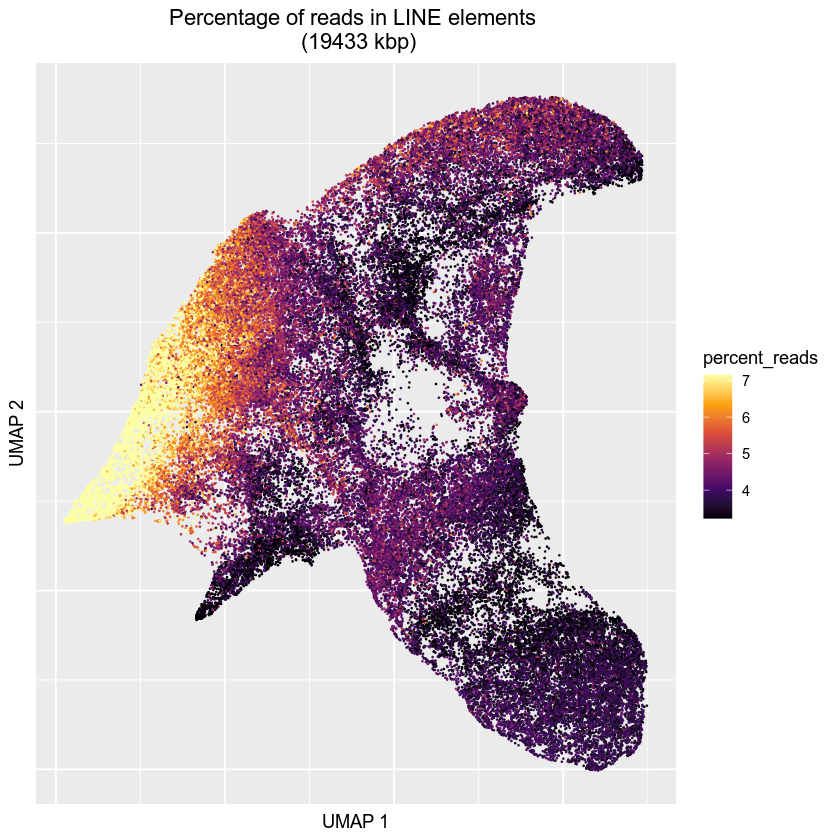

In [314]:
options(repr.plot.width = 7, repr.plot.height = 7)

df = data.frame(umap1=metaData$umap1, 
                umap2=metaData$umap2,
                percent_reads=100*norm_reads_in_region)
# shuffle so days don't overlap
df = df[sample(dim(df)[1]), ]

ggplot(df) +
# ggplot(df[df$x.sp.sample %in% c("D14"), ]) +
geom_point(size=0.1, alpha=1, aes(x=umap1 , y=umap2, col=percent_reads)) +
ggtitle(sprintf("Percentage of reads in LINE elements \n (%d kbp)",  
               as.integer(sum(width(pmat_regions_gr[queryHits(findOverlaps(pmat_regions_gr, region_gr)), ]))/1000))) + 
xlab("UMAP 1") + ylab("UMAP 2") +
scale_color_viridis_c(limits=c(quantile(100*norm_reads_in_region, 0.1), 
                               quantile(100*norm_reads_in_region, 0.95)), 
                      oob=squish, option = "B") +
theme(plot.title = element_text(hjust = 0.5),
     axis.ticks = element_blank(),
     axis.text =element_blank())

### TEMP

In [276]:
qc = read.table("../20200424_ArchR/QualityControl/D0/D0-Pre-Filter-Metadata.tsv", sep='\t' ,header=T, comment.char="")

In [278]:
for (d in DAYS[2:length(DAYS)]) {
    qc = rbind(qc, 
              read.table(sprintf("../20200424_ArchR/QualityControl/%s/%s-Pre-Filter-Metadata.tsv",  d, d),
                         sep='\t' ,header=T, comment.char=""))    
}

In [282]:
rownames(qc) = sub("#", "_", qc$cellNames)
qc$cellNames = NULL
head(qc)

,nFrags,nMonoFrags,nDiFrags,nMultiFrags,TSSEnrichment,ReadsInTSS,Keep,ReadsInPromoter,PromoterRatio,ReadsInBlacklist,BlacklistRatio
,<int>,<int>,<int>,<int>,<dbl>,<int>,<int>,<int>,<dbl>,<int>,<dbl>
D0_CATGCAAACTGCGCCA,72241,39875,25639,6727,4.310,6320,1,9166,0.06344043,1089,0.007537271
D0_CCCATGTACAGCTTTG,70088,24317,35513,10258,9.713,20249,1,22257,0.15877896,1219,0.008696210
D0_AAGGTAATGACGCGAA,68843,25823,33816,9204,10.239,21991,1,23617,0.17152797,999,0.007255640
D0_CTAGCTCACCCGTTAA,68035,27252,31742,9041,10.787,21653,1,22723,0.16699493,969,0.007121335
D0_GGTTCCTTGCGAGTTT,66577,25139,33064,8374,9.515,18596,1,20297,0.15243252,886,0.006653950
D0_CAGTGGAGAGCTCTTC,66485,24881,32713,8891,9.687,17987,1,19042,0.14320523,1016,0.007640821


In [300]:
qc$NoNucFrac = (qc$nDiFrags+qc$nMultiFrags)/qc$nMonoFrags

In [301]:
min(qc$NoNucFrac)
median(qc$NoNucFrac)
max(qc$NoNucFrac)

[1] 0.08436214

[1] 1.700385

[1] 35.32

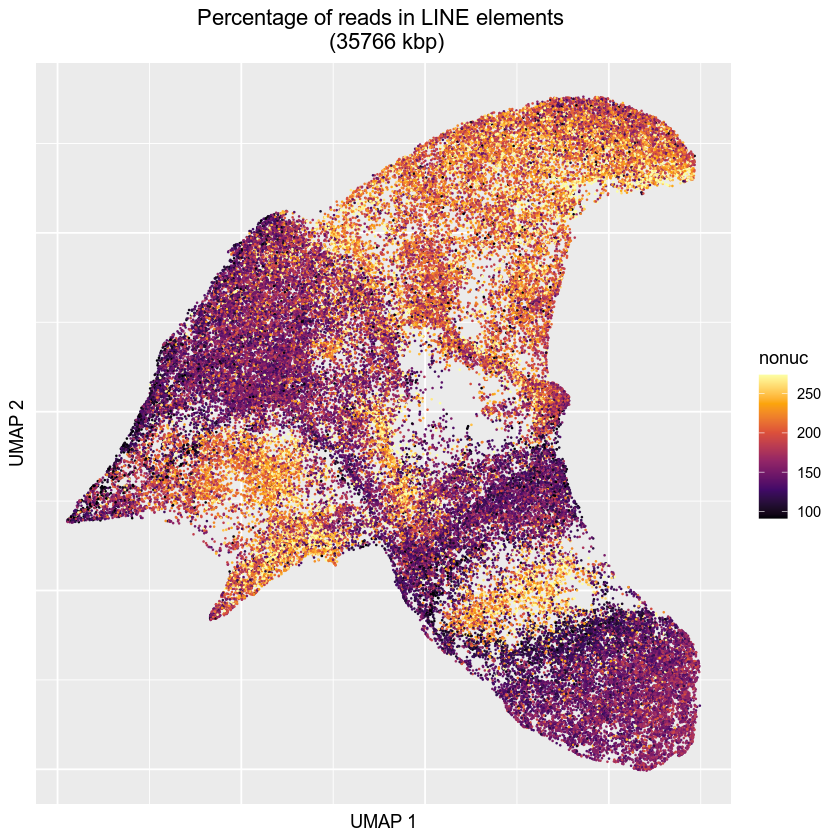

In [302]:
options(repr.plot.width = 7, repr.plot.height = 7)

df = data.frame(umap1=metaData$umap1, 
                umap2=metaData$umap2,
                nonuc=100*qc[rownames(metaData),]$NoNucFrac)
# shuffle so days don't overlap
df = df[sample(dim(df)[1]), ]

ggplot(df) +
# ggplot(df[df$x.sp.sample %in% c("D14"), ]) +
geom_point(size=0.1, alpha=1, aes(x=umap1 , y=umap2, col=nonuc)) +
ggtitle(sprintf("Percentage of reads in LINE elements \n (%d kbp)",  
               as.integer(sum(width(pmat_regions_gr[queryHits(findOverlaps(pmat_regions_gr, region_gr)), ]))/1000))) + 
xlab("UMAP 1") + ylab("UMAP 2") +
scale_color_viridis_c(limits=c(quantile(100*qc[rownames(metaData),]$NoNucFrac, 0.01), 
                               quantile(100*qc[rownames(metaData),]$NoNucFrac, 0.95)), 
                      oob=squish, option = "B") +
theme(plot.title = element_text(hjust = 0.5),
     axis.ticks = element_blank(),
     axis.text =element_blank())

### Reads in Clustered Peak Sets

In [244]:
# fnames = c("../20200307_fine_clustering/beds/20200330_gridmap_peakwidthnorm_n20/idx5.bed")
fnames = c("../20200307_fine_clustering/beds/20200526_gridmap_peakwidthnorm_znorm_idr_n10/tmp")
# fnames = c("../20200331_gc_stratify/beds/20200403_fibr_cluster6_lt_0.2_quantile_gc10/gc_0.1_0.32.bed",
#           "../20200331_gc_stratify/beds/20200403_fibr_cluster6_lt_0.2_quantile_gc10/gc_0.32_0.35.bed")
# fnames = c("./tmp.bed")
# fnames = list(gzfile("/oak/stanford/groups/akundaje/surag/GEO/GSE36570/croo/SRR445817/peak/idr_reproducibility/idr.optimal_peak.narrowPeak.gz"))

region_gr = read.table(fnames[[1]])

if (length(fnames)>1) {
    for (i in seq(2, length(fnames))) {
        region_gr = rbind(region_gr, read.table(fnames[[i]]))
    }
}
# region_gr = read.table("../20200304_transient_peaks/beds/20200305_heatmap_bulk_n15/idx1.bed")
# region_gr = read.table("./beds/20200328_tmp_n20/idx14.1000bp.bed")
colnames(region_gr) = c("chr", "start", "end")
region_gr = makeGRangesFromDataFrame(region_gr)

In [245]:
# region_gr = GRanges((cur_diff_peaks)[1:10000])

In [246]:
norm_reads_in_region = Matrix::rowSums(pmat[, unique(queryHits(findOverlaps(pmat_regions_gr, region_gr)))])/pmatRowSums

In [247]:
max(norm_reads_in_region)
median(norm_reads_in_region)
min(norm_reads_in_region)
max(norm_reads_in_region)/min(norm_reads_in_region)

[1] 0.1070196

[1] 0.03932604

[1] 0.01145475

[1] 9.342808

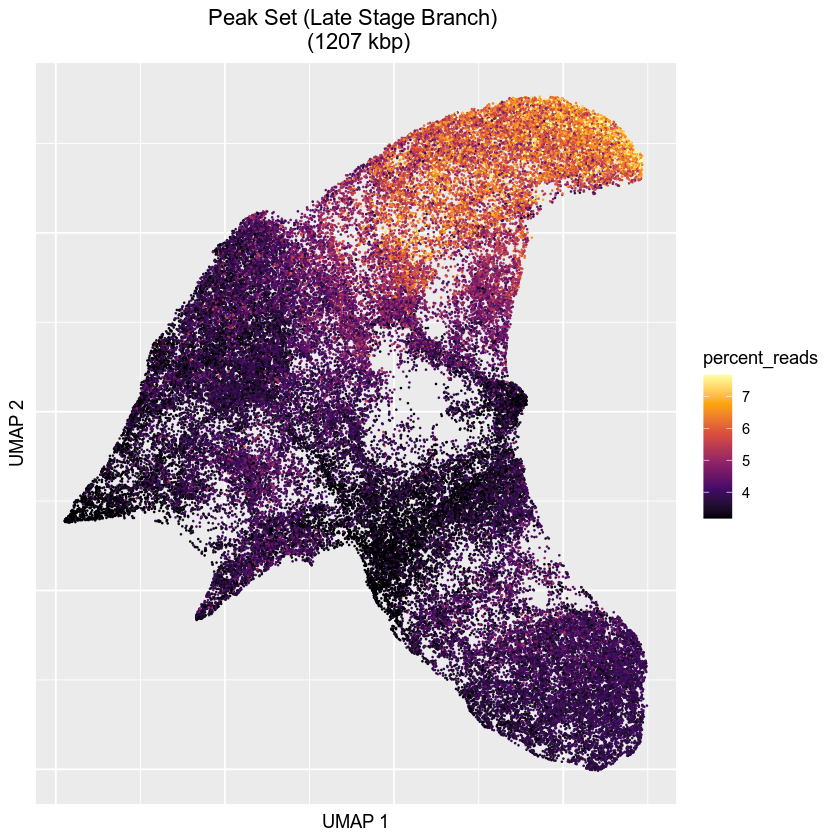

In [248]:
options(repr.plot.width = 7, repr.plot.height = 7)

df = data.frame(umap1=metaData$umap1, 
                umap2=metaData$umap2,
                percent_reads=100*norm_reads_in_region)
# shuffle so days don't overlap
df = df[sample(dim(df)[1]), ]

ggplot(df) +
# ggplot(df[df$percent_reads<2, ]) +
geom_point(size=0.1, alpha=1, aes(x=umap1 , y=umap2, col=percent_reads)) +
ggtitle(sprintf("Peak Set (Late Stage Branch) \n (%d kbp)",  
               as.integer(sum(width(region_gr))/1000))) + 
xlab("UMAP 1") + ylab("UMAP 2") +
scale_color_viridis_c(limits= c(quantile(100*norm_reads_in_region, 0.1), 
                              quantile(100*norm_reads_in_region, 0.995)), 
                      oob=squish, option = "B") +
theme(plot.title = element_text(hjust = 0.5),
     axis.ticks = element_blank(),
     axis.text =element_blank())

### Reads in One/Few Peaks 

In [2630]:
# is single or few bins
region = "chr17:31294646-31297435"
region_gr = GRanges(c(region))

In [2631]:
intersection_idxs = unique(queryHits(findOverlaps(GRanges(as.character(x.sp@peak)), region_gr)))
intersection_idxs

[1] 175213 175214

In [2632]:
# num_reads_in_region = x.sp@pmat[, intersection_idxs]
num_reads_in_region = Matrix::rowSums(x.sp@pmat[, intersection_idxs])

In [2633]:
max(num_reads_in_region)

[1] 3

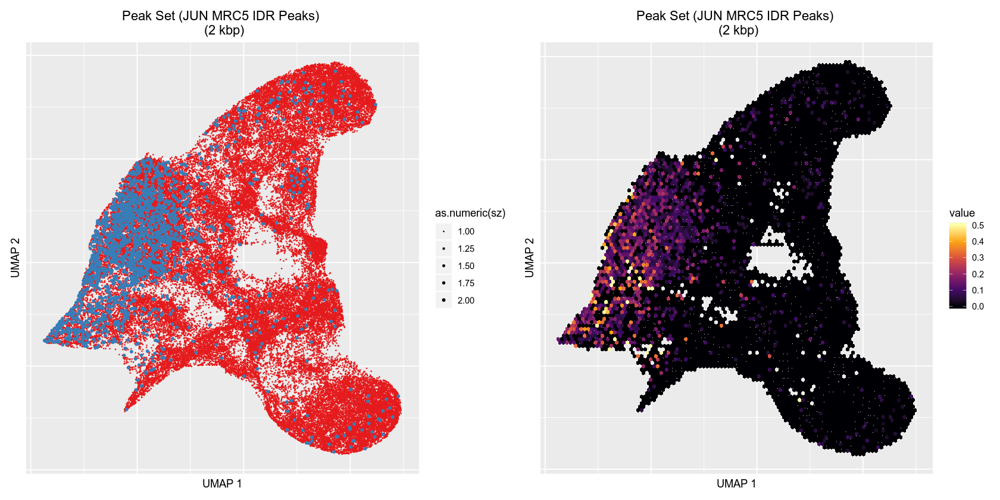

In [2635]:
df = data.frame(x.sp@umap, percent_reads=num_reads_in_region)
df$sz = ifelse(df$percent_reads>0, 2, 1)
# bring to top
df = df[order(df$percent_reads), ]

# BINARY READS: BIGGER DOTS FOR CELLS WITH >0 READ IN REGION
plot1 <- ggplot(df) +
# ggplot(df[df$percent_reads<2, ]) +
geom_point(alpha=1, aes(x=umap.1 , y=umap.2, col=percent_reads>0, size=as.numeric(sz))) +
ggtitle(sprintf("Peak Set (JUN MRC5 IDR Peaks) \n (%d kbp)",  
               as.integer(sum(width(region_gr))/1000))) + 
xlab("UMAP 1") + ylab("UMAP 2") +
# scale_color_viridis_c(limits= c(quantile(100*norm_reads_in_region, 0.1), 
#                                quantile(100*norm_reads_in_region, 0.95)), 
#                       oob=squish, option = "B") +
scale_color_brewer(breaks=DAYS, palette = "Set1") +
theme(plot.title = element_text(hjust = 0.5),
     axis.ticks = element_blank(),
     axis.text =element_blank())+
scale_size_continuous(range = c(0.1, 1))

df = data.frame(x.sp@umap, num_reads=num_reads_in_region)
df$sz = ifelse(df$num_reads>0, .2, 0.1)
# shuffle so days don't overlap
df = df[order(df$num_reads), ]
df_nonzero = df[df$num_reads>0, ]

# AGGREGATE READS: SUM RAW READS IN PEAKS IN UMAP SPACE 
plot2 <- ggplot(df, aes(x=umap.1 , y=umap.2, z=num_reads)) +
# geom_point(alpha=1, , size=0.1) +
stat_summary_hex(bins=100) +
# stat_bin2d(data=df_nonzero, aes(x=umap.1 , y=umap.2), bins=100) +
ggtitle(sprintf("Peak Set (JUN MRC5 IDR Peaks) \n (%d kbp)",  
               as.integer(sum(width(region_gr))/1000))) + 
xlab("UMAP 1") + ylab("UMAP 2") +
scale_fill_viridis_c(limits=c(0,.5), option="B", oob=squish) +
theme(plot.title = element_text(hjust = 0.5),
     axis.ticks = element_blank(),
     axis.text =element_blank())+
scale_size_continuous(range = c(0.1, .5))


options(repr.plot.width = 14, repr.plot.height = 7)
plot1 | plot2

### Colouring by Old Clusters

In [773]:
# using old metadata to annotate (these clusters were used to call peaks)

# Metadata file from previous run
# should contain, sample_barcode as rowname, sample, umap1, umap2, cluster
old_metaData = read.table("../20200122_snapATAC/snapATAC_sessions/20200125_n76770/metadata.tsv", header = T)
rownames(old_metaData) =  paste(old_metaData$sample, old_metaData$barcode, sep='_')
old_metaData = old_metaData[rownames(metaData), ]
head(old_metaData, 2)

,barcode,cluster,umap1,umap2,barcode.1,TN,UM,PP,UQ,CM,landmark,cluster.1,sample
,<fct>,<int>,<dbl>,<dbl>,<fct>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<fct>
D0_AAACAACGACGATTAC,AAACAACGACGATTAC,6,2.515876,8.252824,AAACAACGACGATTAC,42629,38455,38381,33575,51,0,6,D0
D0_AAACAACGACTCACGG,AAACAACGACTCACGG,6,2.355841,7.403916,AAACAACGACTCACGG,4424,4009,3998,3694,4,0,6,D0


In [774]:
sum(is.na(old_metaData$cluster.1))

[1] 330

Warning message:
"Removed 330 rows containing missing values (geom_point)."


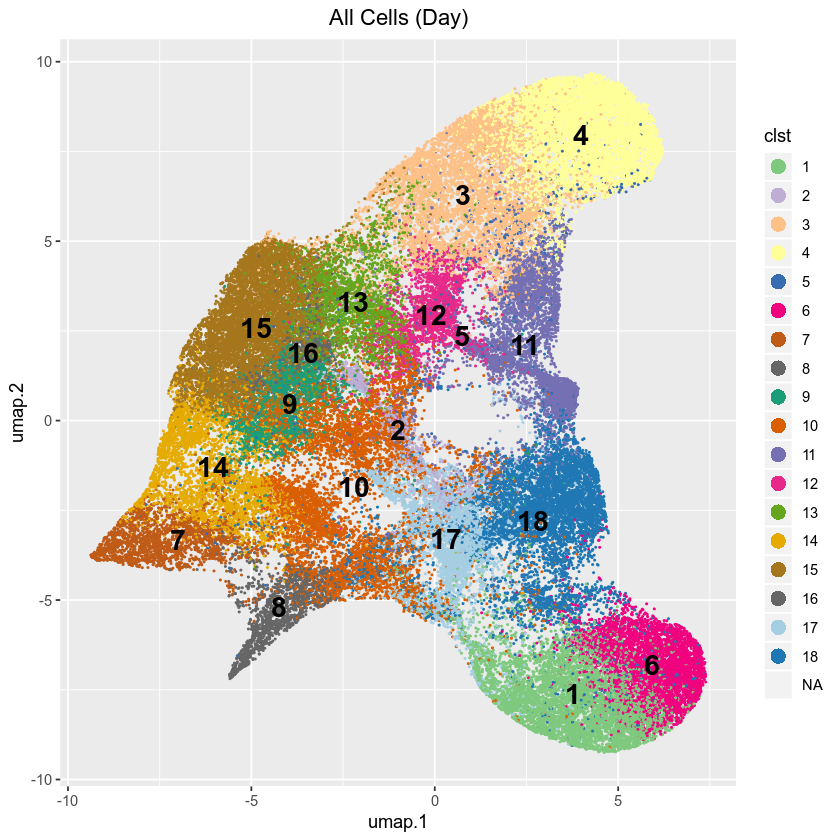

In [1283]:
options(repr.plot.width = 7, repr.plot.height = 7)

df = data.frame(x.sp@umap, clst=as.factor(old_metaData$cluster.1))
# shuffle so days don't overlap
df = df[sample(dim(df)[1]), ]

ggplot(df) +
# ggplot(df[df$x.sp.sample %in% c("D14"), ]) +
geom_point(size=0.2, alpha=1, aes(x=umap.1 , y=umap.2, col=clst)) +
# scale_color_brewer( palette = "Set1") +
scale_color_manual(values=col_vector) +
geom_text(data=data.frame(aggregate(x.sp@umap, list(old_metaData$cluster.1), mean)),
         aes(x=umap.1, y=umap.2, label=Group.1), size=6, fontface = "bold") +
ggtitle("All Cells (Day)") + 
theme(plot.title = element_text(hjust = 0.5)) +
#       legend.positio = "none")
guides(colour = guide_legend(override.aes = list(shape=16, alpha=1, size=4))) 

## Signal at Gene Sets from RNA expression

In [53]:
# load bulk RNA-seq data
fpkm = read.table("/users/surag/kundajelab/scATAC-reprog/resources/GSE62777/RNAseq.FPKM.tsv", sep='\t', header=T)
fpkm$gene_id = NULL
fpkm$locus=NULL
tpm = fpkm
tpm[,2:ncol(tpm)] = 1e6*t(t(tpm[,2:ncol(tpm)])/colSums(tpm[,2:ncol(tpm)]))

# removing genes with dup names
tpm = tpm[!duplicated(tpm$gene_short_name),]
rownames(tpm) = tpm$gene_short_name
tpm$gene_short_name = NULL

tpm["GAPDH",]

,hiF.T_P14,X2dd_DOX_plus,X5dd_DOX_plus,X8dd_DOX_plus,X10dd_DOX_plus_SSEA3_pos,X14dd_DOX_plus_SSEA3_pos,X20dd_DOX_plus_TRA_plus,X24dd_TRA_pos_DOX_plus,X24dd_TRA_pos_DOX_minus,hIPSC.T_P10
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
GAPDH,7803.64,4963.505,3908.693,3839.776,3795.548,3364.503,3032.412,3790.955,5598.224,4731.256


In [1589]:
genes_subset = rownames(tpm)[(rowMaxs(as.matrix(tpm))==rowMaxs(as.matrix(tpm[,2:3])))&
                                (rowMaxs(as.matrix(tpm))>1)&
                                (tpm[,1]<10)]
#                                 (tpm[,10]<10)]

In [1590]:
length(genes_subset)

[1] 1428

In [1591]:
gene_matrix = summed_gene
mean_across_genes = colMeans(gene_matrix[lapply(strsplit(rownames(gene_matrix), "-"), "[[", 1) %in% genes_subset, ])

In [1592]:
max(mean_across_genes)/min(mean_across_genes)

[1] 1.117063

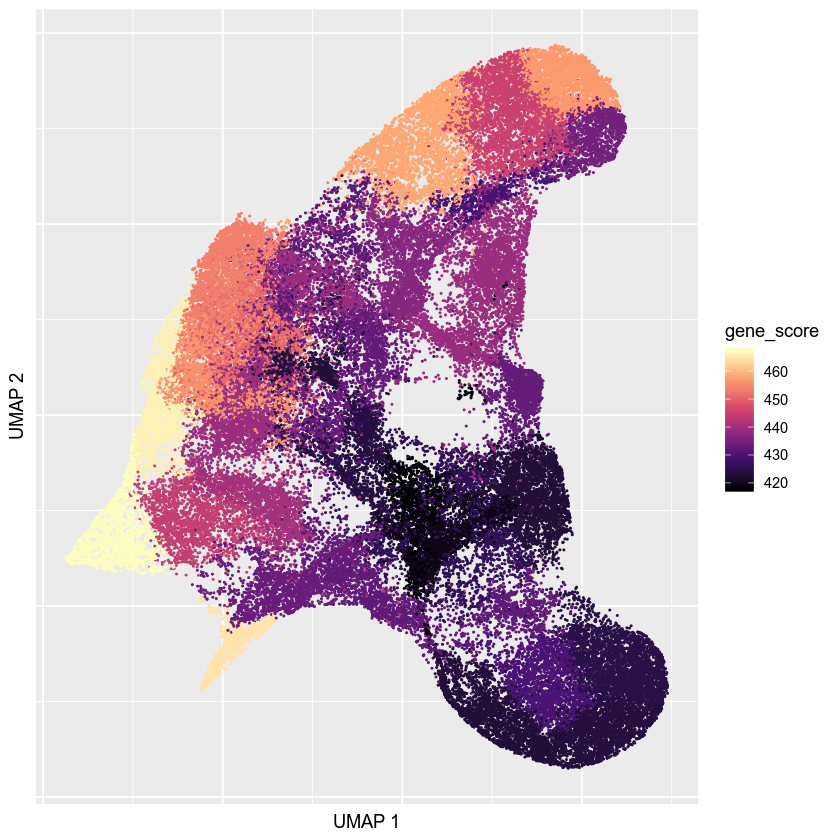

In [1593]:
options(repr.plot.width = 7, repr.plot.height = 7)

df = data.frame(x.sp@umap, gene_score=mean_across_genes[clusters])
# shuffle so days don't overlap
df = df[sample(dim(df)[1]), ]

ggplot(df) +
# ggplot(df[df$x.sp.sample %in% c("D14"), ]) +
geom_point(size=0.2, alpha=1, aes(x=umap.1 , y=umap.2, col=gene_score)) +
# ggtitle(sprintf("Gene Scores (%s)", GENE)) + 
xlab("UMAP 1") + ylab("UMAP 2") +
scale_color_viridis_c(oob=squish, option = "A") +
theme(plot.title = element_text(hjust = 0.5),
     axis.ticks = element_blank(),
     axis.text =element_blank())

In [1594]:
"MAP2" %in% genes_subset
head(genes_subset)

[1] TRUE

[1] "SLC7A2" "THSD7A" "REV3L"  "ETV7"   "POLR3B" "ANGEL1"

In [2146]:
ALL_PEAKS_BED_PATH = "tmp.txt"
fileConn = file(ALL_PEAKS_BED_PATH)

writeLines(genes_subset, fileConn)
close(fileConn)

## D0 Diff Peaks

In [1728]:
data.use = cts[, c("cluster_1", "cluster_8")]
group = factor(colnames(data.use), levels = colnames(data.use))
design = model.matrix(~0+group)
y = DGEList(counts=data.use, group=group)
et = exactTest(y, dispersion = 0.4^2)
cur_diff_peaks = rownames(et$table[order((1/et$table$PValue)*ifelse(et$table$logFC>0, 1, -1)),])  

In [1113]:
frac_in_peakset = Matrix::rowSums(x.sp@pmat[, as.character(x.sp@peak) %in% cur_diff_peaks[1:10000]])/pmatRowSums

In [1114]:
frac_in_peakset_rev = Matrix::rowSums(x.sp@pmat[, as.character(x.sp@peak) %in% rev(cur_diff_peaks)[1:10000]])/pmatRowSums

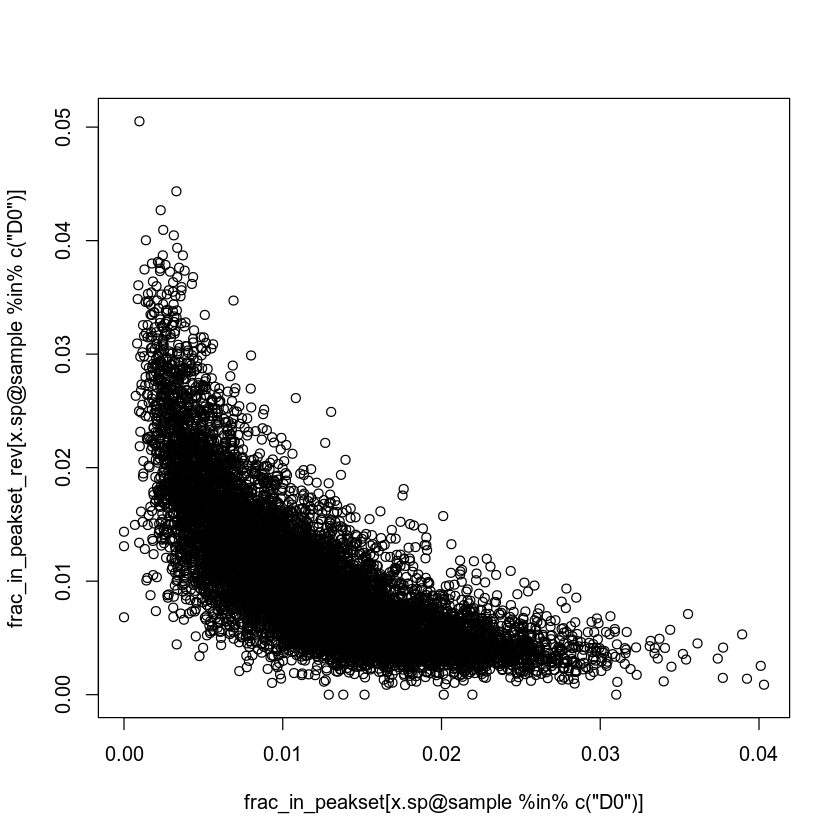

In [1115]:
plot(frac_in_peakset[x.sp@sample %in% c("D0")], frac_in_peakset_rev[x.sp@sample %in% c("D0")])

In [1723]:
options(repr.plot.width = 7, repr.plot.height = 7)
selected_cluster_id = 10

twoplots = list()
i=1
cur_days = DAYS #c("D0", "D2")
for (toplot in list(frac_in_peakset, frac_in_peakset_rev)) {

    # df = data.frame(x.sp@umap, accs=km_mb$centroids[selected_cluster_id, ][clusters])
    cur_selected = toplot[x.sp@sample %in% cur_days]
    cur_med = quantile(cur_selected, 0.5)

    # or a specific peak
    # df = data.frame(x.sp@umap, accs=log2(1+colSums(norm_cts[rev(cur_diff_peaks)[1:1000], ]))[clusters])
    df = data.frame(x.sp@umap, x.sp@sample, frip=toplot)
    # shuffle so days don't overlap
    df = df[sample(dim(df)[1]), ]

    # ggplot(df) +
    twoplots[[i]] <- ggplot(df[df$x.sp.sample %in% cur_days, ]) +
    geom_point(size=0.1, alpha=1, aes(x=umap.1 , y=umap.2, col=frip)) +
    ggtitle(sprintf("Fraction of Reads in Peak Set %d (per cell)", i)) + 
    xlab("UMAP 1") + ylab("UMAP 2") +
    scale_color_viridis_c(limits=c(quantile(cur_selected, 0.1), 
                                   quantile(cur_selected, 0.99)), oob=squish, option = "A") +
    theme(plot.title = element_text(hjust = 0.5))
    
    i = i+1
}

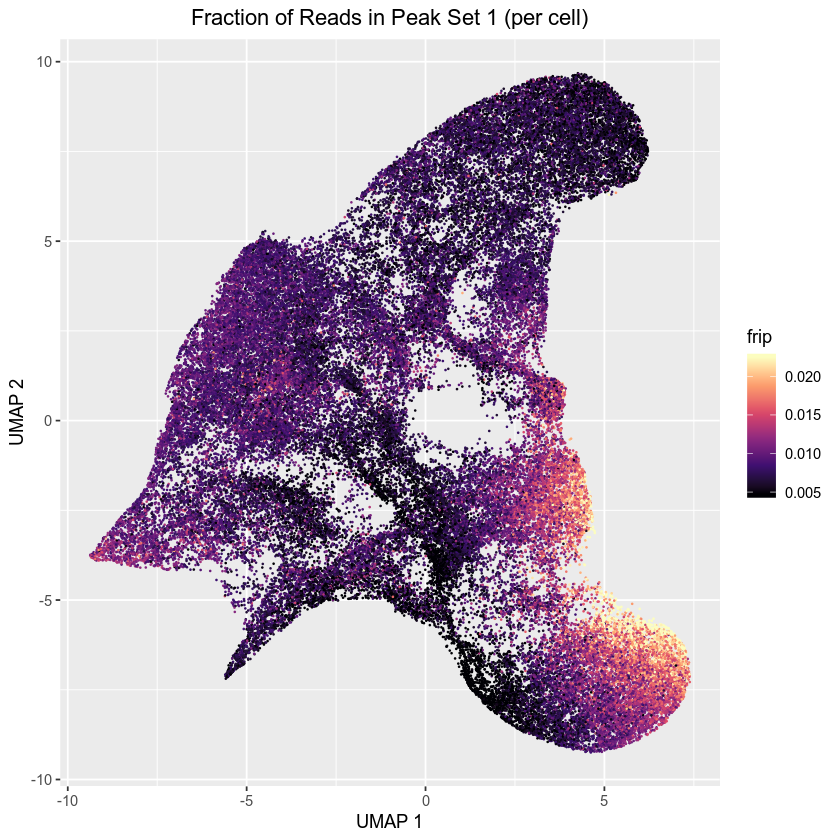

In [1726]:
options(repr.plot.width = 7, repr.plot.height = 7)
twoplots[[1]]

In [1840]:
sum(x.sp@pmat[1:10, 1:1000])

[1] 274